# Auto Insurance claims fraud detection.

# Introduction.



Insurance fraud is a deliberate deception perpetrated against an insurance company for the purpose of a financial gain. Fraud may be committed at different points in the transaction by applicants, policyholders, third-party claimants, or professionals who provide services to claimants. 
Fraud accounted for between 15 percent and 17 percent of total claims payments for auto insurance bodily injury in 2012, according to an Insurance Research Council (IRC) study. The study estimated that between $5.6 billion and $7.7 billion was fraudulently added to paid claims for auto insurance bodily injury payments in 2012, compared with a range of $4.3 billion to $5.8 billion in 2002.

One of the most effective means of combating fraud is the adoption of data technologies that cut the time needed to recognize fraud. 
Traditional approaches, such as using automated red flags and business rules, have been augmented by predictive modeling, and link analysis—which examines the relationships between items like people, places and events. Artificial intelligence can be used, among other tools, to uncover fraud before a payment is made. These newer strategies are employed when claims are first filed. Suspicious claims are flagged for further review, while those with no suspicious elements are processed normally. In search of refinement, insurers are blending tools to improve their fraud detection programs.
 
In this analysis we will focus on  fraud claims committed by insured  individuals. 
The purpose of this analysis is to find a model that will enable the prediction if an auto claim is a fraud or not.



This document contains the following sections:

[Exploratory Data Analysis](#Exploratory_Data_Analysis)

[Feature Transformation](#Feature_Transformation)

[Modeling](#Modeling_section)

[Future Improvements](#Summary_section)

# <a name="Exploratory_Data_Analysis"></a>**Exploratory Data Analysis**

This database contains 1000 auto claims in three states, OH, IL, and IN. We can find the database at: [Keggle insurance database](https://www.kaggle.com/roshansharma/insurance-claim)

For these claims,  the database has the following 39 features:



*  months_as_customer 
*  age
*   policy_number
*   policy_bind_date
*   policy_state 
*   policy_csl
*   policy_deductable
*   policy_annual_premium
*   umbrella_limit
*   insured_zip
*   insured_sex
*   insured_education_level
*   insured_occupation
*   insured_hobbies
*   insured_relationship
*   capital-gains
*   capital-loss
*   incident_date
*   incident_type
*   collision_type
*   incident_severity
*   authorities_contacted
*   incident_state 
*   incident_city
*   incident_location
*   incident_hour_of_the_day
*   number_of_vehicles_involved
*   property_damage
*   bodily_injuries
*   witnesses
*   police_report_available
*   total_claim_amount
*   injury_claim 
*   property_claim
*   vehicle_claim
*   auto_make
*   auto_model
*   Lauto_year 
*   fraud_reported 








































Used libraries:

In [13]:
# Import relevant libraries and packages.
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns 
import joypy

In [28]:
# for interactive visualizations
import plotly
import plotly.offline as py
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
from plotly import tools
init_notebook_mode(connected = True)
import plotly.figure_factory as ff

# for animated visualizations
from bubbly.bubbly import bubbleplot
import plotly_express as px

In [29]:
import os
os.getcwd()


'/Users/jose1/Desktop/SpringboardLalli/PTOJECT_1/Insurance_project 1'

In [9]:
#This code is used when running on Google Colab
#os.chdir('/Users/jose1/Desktop/SpringboardLalli/PTOJECT_1/Insurance_project/')
#!ls

#from google.colab import files

#claims = files.upload()

#for fn in claims.keys():
#  print('User uploaded file "{name}" with length {length} bytes'.format(
#      name=fn, length=len(claims[fn])))

sample_data


Saving insurance_claims.csv to insurance_claims.csv
User uploaded file "insurance_claims.csv" with length 266960 bytes


In [30]:
os.getcwd()
!ls

Untitled.ipynb
Untitled1.ipynb
V2_Insurance_Auto_Claims_fraud_detection_EDA_FM_Modeling.ipynb
V3-Insurance_Auto_Claims_fraud_detection_Citlalli_Blanchet.ipynb
V4-Insurance_Auto_Claims_fraud_detection_Citlalli_Blanchet.ipynb
insurance_claims.csv
pivottablejs.html
plot 4.html


In [31]:
#Import the data
claims = pd.read_csv('insurance_claims.csv')

In [32]:
# let's take a look at the data
pd.set_option('display.max_columns', None)#If max_cols is exceeded, switch to truncate view. Depending on large_repr, objects are either centrally truncated or printed as a summary view.
#‘None’ value means unlimited.
claims.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N


In [33]:
claims.shape

(1000, 39)

In [34]:
claims['policy_state'].value_counts()

OH    352
IL    338
IN    310
Name: policy_state, dtype: int64

In [35]:
claims.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 39 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In [36]:
claims.describe()

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,546238.648000,1136.000000,1256.406150,1.101000e+06,501214.488000,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000
std,115.113174,9.140287,257063.005276,611.864673,244.167395,2.297407e+06,71701.610941,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861
min,0.000000,19.000000,100804.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000
25%,115.750000,32.000000,335980.250000,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000
50%,199.500000,38.000000,533135.000000,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000
75%,276.250000,44.000000,759099.750000,2000.000000,1415.695000,0.000000e+00,603251.000000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000
max,479.000000,64.000000,999435.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000


In [37]:
#Check some categorical variables
claims.nunique()


months_as_customer              391
age                              46
policy_number                  1000
policy_bind_date                951
policy_state                      3
policy_csl                        3
policy_deductable                 3
policy_annual_premium           991
umbrella_limit                   11
insured_zip                     995
insured_sex                       2
insured_education_level           7
insured_occupation               14
insured_hobbies                  20
insured_relationship              6
capital-gains                   338
capital-loss                    354
incident_date                    60
incident_type                     4
collision_type                    4
incident_severity                 4
authorities_contacted             5
incident_state                    7
incident_city                     7
incident_location              1000
incident_hour_of_the_day         24
number_of_vehicles_involved       4
property_damage             

We can see the different levels of education and the different types of incident. 

In [38]:
print(claims.insured_education_level.unique())

['MD' 'PhD' 'Associate' 'Masters' 'High School' 'College' 'JD']


In [39]:
print(claims.incident_type.unique())


['Single Vehicle Collision' 'Vehicle Theft' 'Multi-vehicle Collision'
 'Parked Car']


This dataset does not have missing values. But there is a character that we need to remove '?'. I will first assign it as a null value. I will adentify the features that have this character and then I will replace them depending on the caracteristics of each feature.

In [40]:
#Get the number of missing data points per column
missing_values_count = claims.isnull().sum()
# how many total missing values do we have?
total_cells = np.product(claims.shape)
total_missing = missing_values_count.sum()

# percent of data that is missing
(total_missing/total_cells) * 100

0.0

In [41]:
# We did not find missing values but there is a character, "?" that we would like to replace for NAN value.

claims = claims.replace('?',np.NaN)

claims.isnull().any()

months_as_customer             False
age                            False
policy_number                  False
policy_bind_date               False
policy_state                   False
policy_csl                     False
policy_deductable              False
policy_annual_premium          False
umbrella_limit                 False
insured_zip                    False
insured_sex                    False
insured_education_level        False
insured_occupation             False
insured_hobbies                False
insured_relationship           False
capital-gains                  False
capital-loss                   False
incident_date                  False
incident_type                  False
collision_type                  True
incident_severity              False
authorities_contacted          False
incident_state                 False
incident_city                  False
incident_location              False
incident_hour_of_the_day       False
number_of_vehicles_involved    False
p

In [43]:
#To treat the NAN values let's see their representation or percentage of for the colums that have it.
#Percent of each feature that is missing.
nas=pd.DataFrame(claims.isnull().sum().sort_values(ascending=False)/len(claims),columns = ['percent'])
pos = nas['percent'] > 0
nas[pos]

,percent
property_damage,0.360
police_report_available,0.343
collision_type,0.178


For the Property damage and Police report available features I will assume that a null value correspond to the No value. For the feature Collision type I will the null values for the most common value, the mode.

In [44]:
#For all these variables the percentage of NAN values is small. Given the small sample size(1000), I will suggest modify 
#The row with NAN based on the following criteria:

#Variable: 
#property_damage .- Asume that if there was no response (NAN) then we assign a NO value.

claims['property_damage'].fillna('NO', inplace = True)

# police_report_available .- Assume that the NAN values correspond to a report not filled.

claims['police_report_available'].fillna('NO', inplace = True)

#collision_type .- Replace the NAN values for the most common value in the sample.

claims['collision_type'].fillna(claims['collision_type'].mode()[0], inplace = True)

claims.isnull().any().any()



False

This database is considered an imbalanced dataset becuase the fraud and the non fraud claims are not represented equally. This issie is going to be addressed in the modeling section of this report. 

We can see that the non fraud claims represent 75.3% of the database and the fruad claims represent 24.7% the of the database.

In [59]:
fraud = claims['fraud_reported'].value_counts()

label_fraud = fraud.index
size_fraud = fraud.values

colors = ['silver', 'orange']
trace = go.Pie(
         labels = label_fraud, values = size_fraud, marker = dict(colors = colors), name = 'Frauds', hole = 0.3)


df = [trace]

layout = go.Layout(
           title = 'Distribution of Frauds')

fig = go.Figure(data = df, layout = layout)

py.iplot(fig)

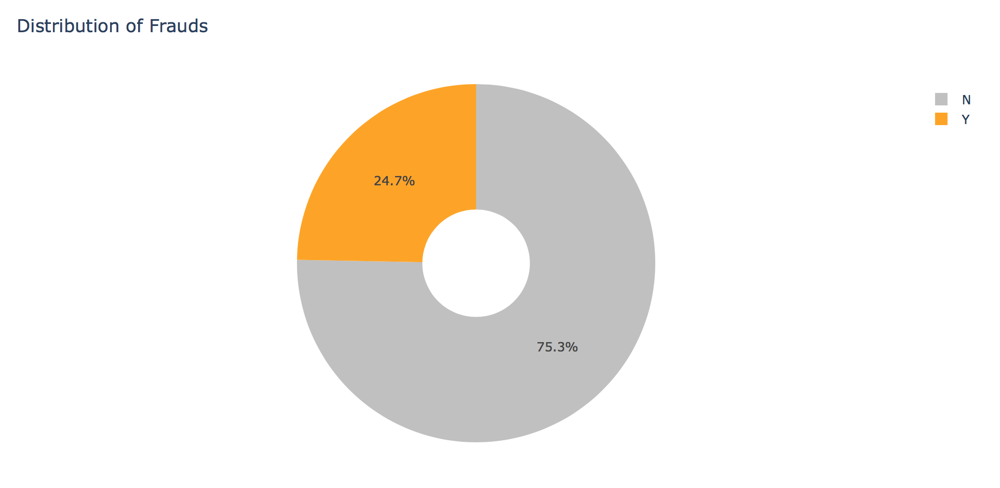

In [45]:
claims.corr()

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
months_as_customer,1.000000,0.922098,0.057555,0.026807,0.005018,0.015498,0.017895,0.006399,0.020209,0.070639,0.014736,-0.010162,0.058383,0.062108,0.065329,0.034940,0.061013,-0.000292
age,0.922098,1.000000,0.059413,0.029188,0.014404,0.018126,0.025604,-0.007075,0.007368,0.087161,0.022102,-0.015679,0.052359,0.069863,0.075522,0.060898,0.062588,0.001354
policy_number,0.057555,0.059413,1.000000,-0.006738,0.022566,0.008968,0.007083,0.009802,-0.005669,0.000113,0.013432,-0.004558,-0.012661,-0.018009,-0.008762,-0.010678,-0.020184,-0.000183
policy_deductable,0.026807,0.029188,-0.006738,1.000000,-0.003245,0.010870,0.004545,0.035212,-0.023544,0.060935,0.051214,-0.022765,0.066639,0.022839,0.039107,0.064792,0.005269,0.026105
policy_annual_premium,0.005018,0.014404,0.022566,-0.003245,1.000000,-0.006247,0.032354,-0.013738,0.023547,-0.001578,-0.045991,0.026780,0.002332,0.009094,-0.017633,-0.011654,0.020246,-0.049226
umbrella_limit,0.015498,0.018126,0.008968,0.010870,-0.006247,1.000000,0.019671,-0.047268,-0.024056,-0.023257,-0.021270,0.022743,-0.006738,-0.040344,-0.045412,-0.023790,-0.038584,0.009893
insured_zip,0.017895,0.025604,0.007083,0.004545,0.032354,0.019671,1.000000,0.006303,0.049372,0.008274,0.027448,0.028695,0.019805,-0.033873,-0.017495,-0.006841,-0.041083,-0.032736
capital-gains,0.006399,-0.007075,0.009802,0.035212,-0.013738,-0.047268,0.006303,1.000000,-0.046904,-0.016406,0.061643,0.055829,-0.017651,0.015980,0.025934,-0.000779,0.015836,0.031398
capital-loss,0.020209,0.007368,-0.005669,-0.023544,0.023547,-0.024056,0.049372,-0.046904,1.000000,-0.025054,-0.014895,-0.024418,-0.041330,-0.036060,-0.046060,-0.022863,-0.032665,-0.056615
incident_hour_of_the_day,0.070639,0.087161,0.000113,0.060935,-0.001578,-0.023257,0.008274,-0.016406,-0.025054,1.000000,0.120794,-0.034563,0.006527,0.217702,0.165768,0.179536,0.215626,0.021368


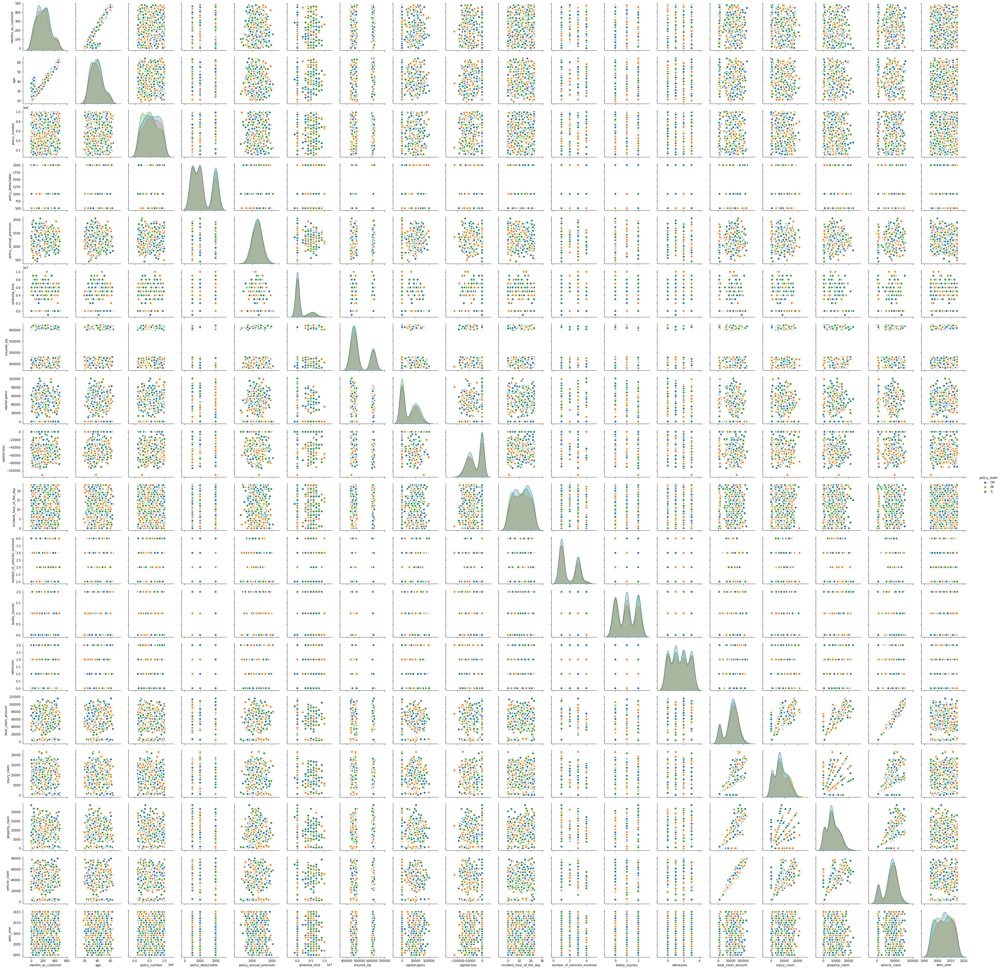

In [46]:
sns.pairplot(claims, kind="scatter", hue="policy_state", plot_kws=dict(s=80, edgecolor="white", linewidth=2.5))
plt.show()

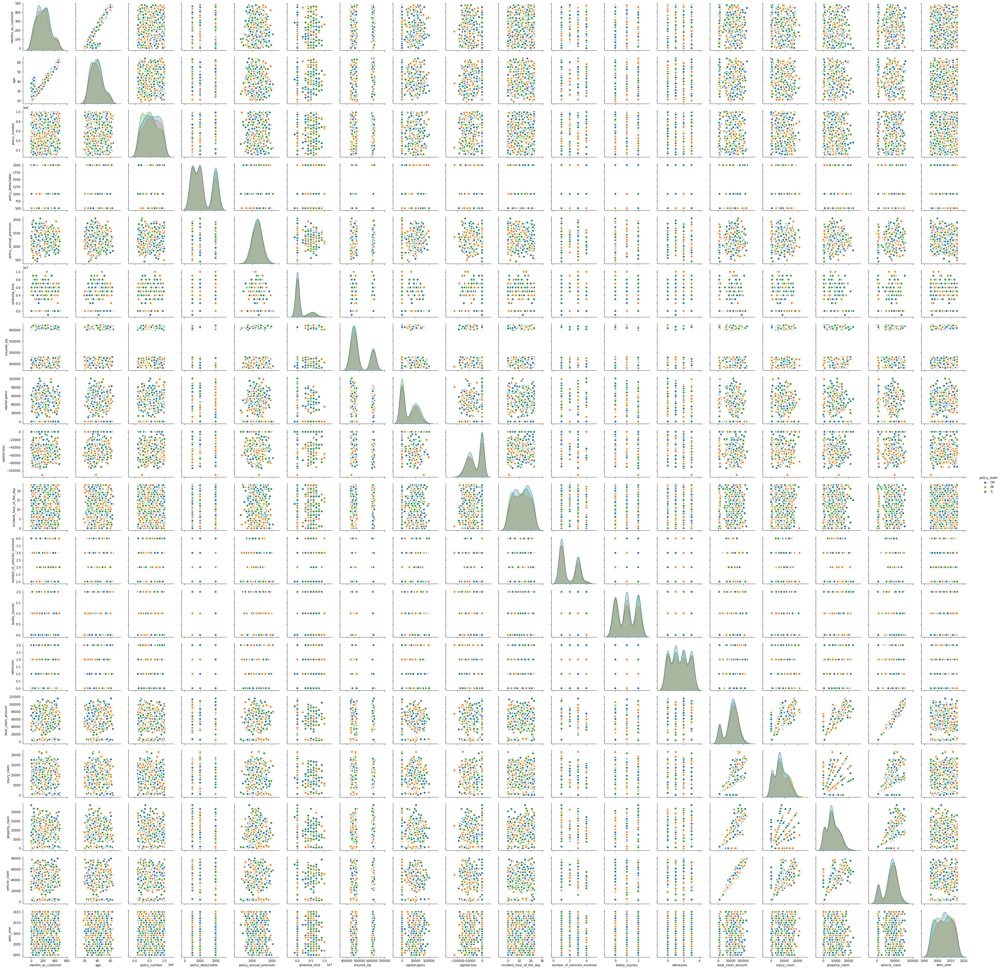

It seems int this correlation plot by State, that there is no visible difference in claim distribution by state.
We can alse see that there is positive high correlation between Total claim amount and vehicle claim as well as with property claim amount and Injury claim.
We can also see a positive high correlation between age and months as customer.

We can see in more detail the correlation coefficient between, vehicle claim as well as with property claim amount and Injury claim amount.

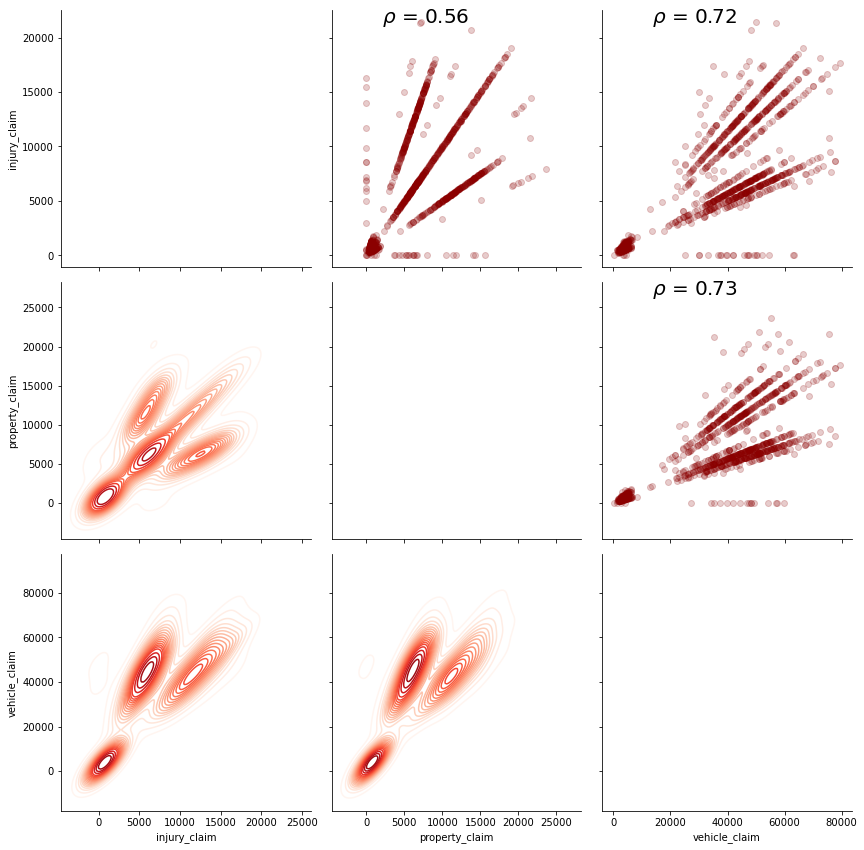

In [57]:
# Function to calculate correlation coefficient between two arrays
def corr(x, y, **kwargs):
    
    # Calculate the value
    coef = np.corrcoef(x, y)[0][1]
    # Make the label
    label = r'$\rho$ = ' + str(round(coef, 2))
    
    # Add the label to the plot
    ax = plt.gca()
    ax.annotate(label, xy = (0.2, 0.95), size = 20, xycoords = ax.transAxes)
    
# Create a pair grid instance
grid = sns.PairGrid(data= claims,
                    vars = ['injury_claim', 'property_claim', 'vehicle_claim'], height = 4)

# Map the plots to the locations
grid = grid.map_upper(plt.scatter, color = 'darkred',alpha=.2)
grid = grid.map_upper(corr)
grid = grid.map_lower(sns.kdeplot, cmap = 'Reds',n_levels=20)
grid = grid.map_diag(plt.hist, bins = 10, edgecolor =  'k', color = 'darkred',alpha=.4);

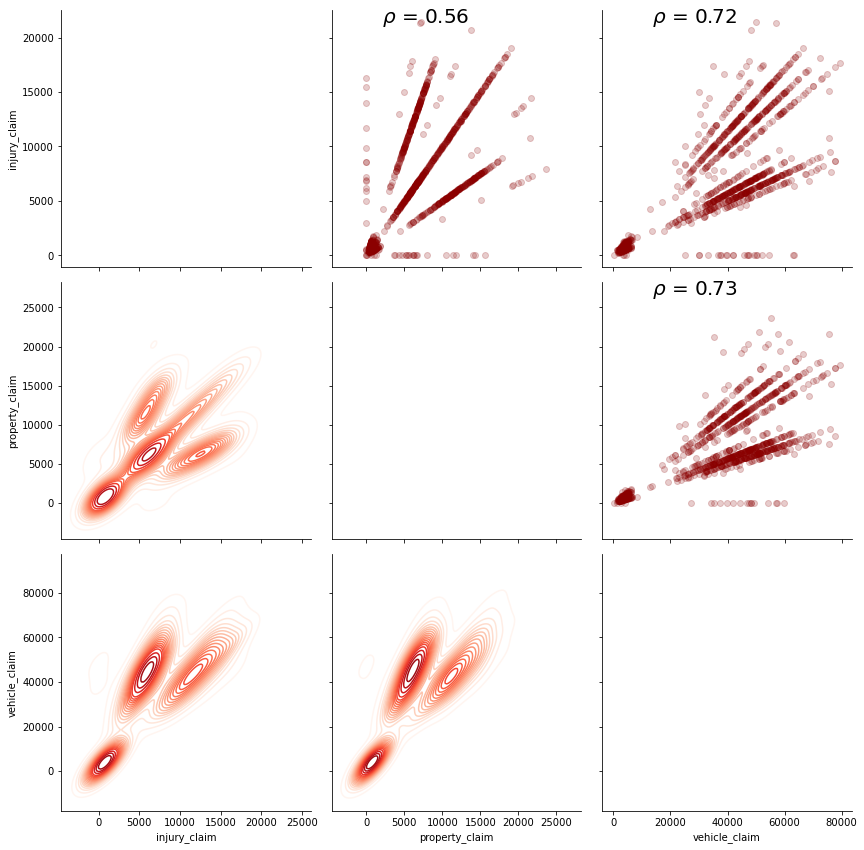

In [58]:
claims['policy_deductable'] = claims.policy_deductable.astype('category')

claims.dtypes



months_as_customer                int64
age                               int64
policy_number                     int64
policy_bind_date                 object
policy_state                     object
policy_csl                       object
policy_deductable              category
policy_annual_premium           float64
umbrella_limit                    int64
insured_zip                       int64
insured_sex                      object
insured_education_level          object
insured_occupation               object
insured_hobbies                  object
insured_relationship             object
capital-gains                     int64
capital-loss                      int64
incident_date                    object
incident_type                    object
collision_type                   object
incident_severity                object
authorities_contacted            object
incident_state                   object
incident_city                    object
incident_location                object


In the followng to charts we can see that there is not a clear pattern on the total claim amount and the anual premium.

We can also see that if we separate the number of police reported claims and those that ended being fraud by education level they are more less evenly distributed among all levels of education. 

An interesting finding is that even when a claim is reported to the police it can be a fraud. This situation occurs on all levels of education.


Parallel Categories Diagram

In [49]:
import plotly.graph_objects as go
from ipywidgets import widgets
import pandas as pd
import numpy as np
import plotly.offline as pyo

pyo.init_notebook_mode()

# Build  dimensions
categorical_dimensions = ['insured_education_level', 'police_report_available', 'fraud_reported'];

dimensions = [dict(values=claims[label], label=label) for label in categorical_dimensions]

# Build colorscale
color = np.zeros(len(claims), dtype='uint8')
colorscale = [[0, 'gray'], [1, 'firebrick']]

# Build figure as FigureWidget
fig = go.FigureWidget(
    data=[go.Scatter(x=claims.policy_annual_premium, y=claims.total_claim_amount,
    marker={'color': 'gray'}, mode='markers', selected={'marker': {'color': 'firebrick'}},
    unselected={'marker': {'opacity': 0.3}}), go.Parcats(
        domain={'y': [0, 0.4]}, dimensions=dimensions,
        line={'colorscale': colorscale
              , 'cmin': 0,
              'cmax': 1, 'color': color, 'shape': 'hspline'})
    ])

fig.update_layout(
        height=800, xaxis={'title': 'Annual premium'},
        yaxis={'title': 'Total Claim Amount', 'domain': [0.6, 1]},
        dragmode='lasso', hovermode='closest')

# Update color callback
def update_color(trace, points, state):
    # Update scatter selection
    fig.data[0].selectedpoints = points.point_inds

    # Update parcats colors
    new_color = np.zeros(len(claims), dtype='uint8')
    new_color[points.point_inds] = 1
    fig.data[1].line.color = new_color

# Register callback on scatter selection...
fig.data[0].on_selection(update_color)
# and parcats click
fig.data[1].on_click(update_color)

fig.show()

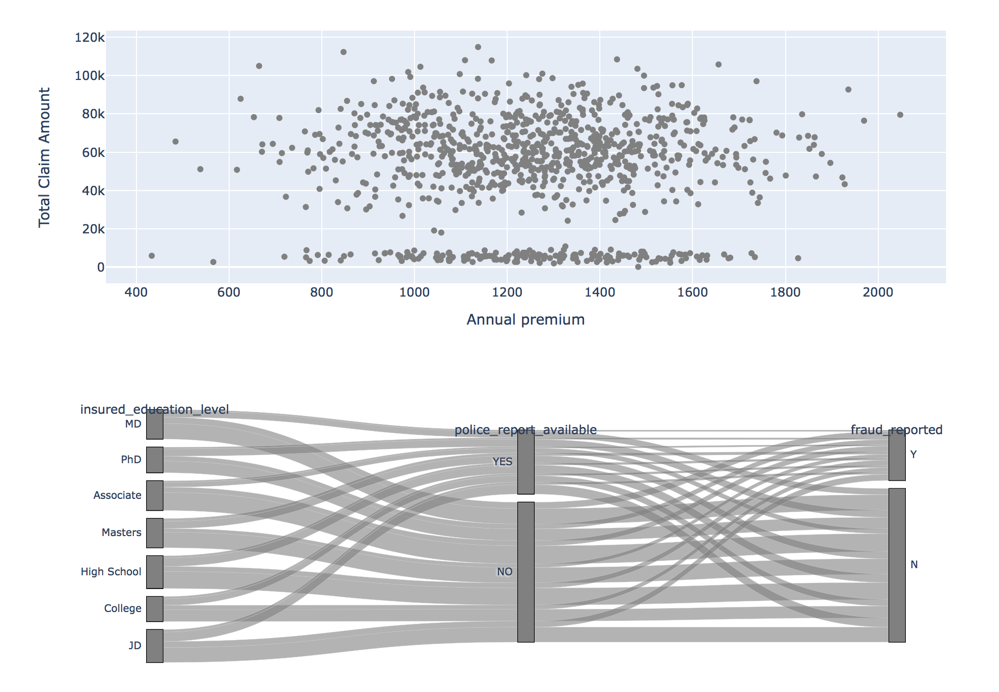

We saw before that there is no visible difference between the incidence of fraud claims by state. The following charts are created to find out if a series of variables behave differently by city.  

From these chats we see that incident hour of the day, number of vehicles involved, and bodily injuries have a similiar behaviour in the different cities of the database.

In the feature transformation and modeling sections of this project, this database will be considered as one group of auto claims. 


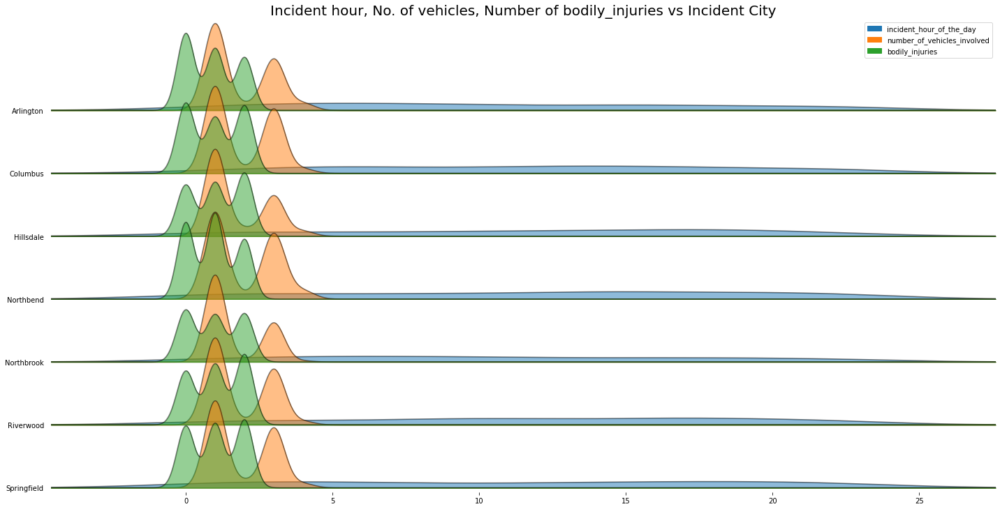

In [ ]:
fig, axes = joypy.joyplot(claims,
                         column = ['incident_hour_of_the_day','number_of_vehicles_involved', 'bodily_injuries'],
                         by = 'incident_city',
                         ylim = 'own',
                         figsize = (20, 10),
                         alpha = 0.5, 
                         legend = True)

plt.title('Incident hour, No. of vehicles, Number of bodily_injuries vs Incident City', fontsize = 20)
plt.show()

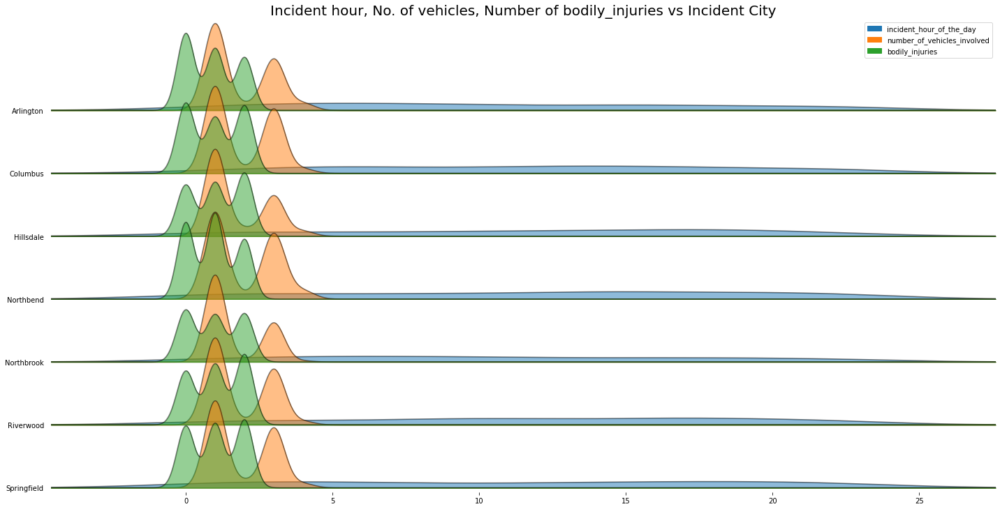

The percentage of fraud by ocupation is relatively evenly distributed. The ocupation that has the higher rate of fraud claims is executive managerial ocupation with 11.3% percentage of fraud claims.


In [60]:
from pivottablejs import pivot_ui
pivot_ui(claims,outfile_path="ocupation_fraud.html")
#Creates an interactive HTML 
#pivot_ui(df, outfile_path="yourpathname.html")

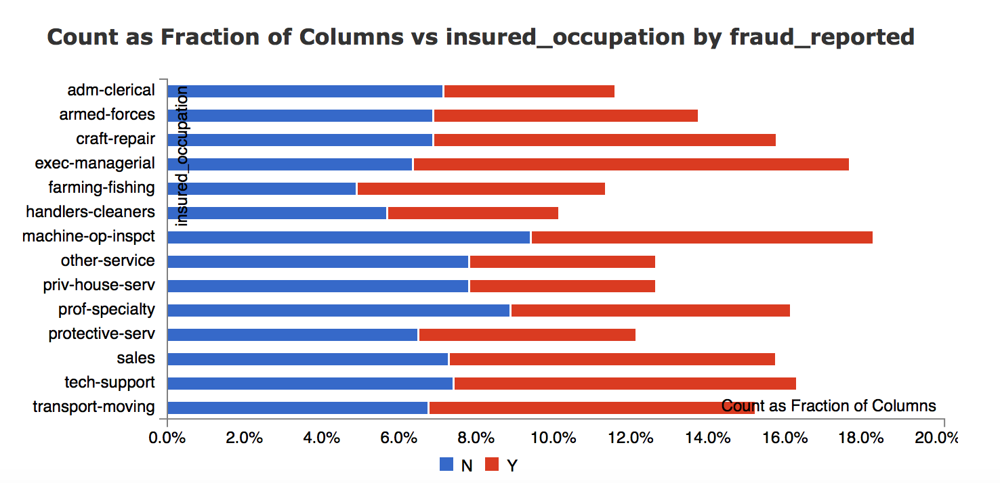

When we look at number of claims when authorities where contacted, the claims that where were frauds contacted police less frequenlty than the claims that where not reported as fraudulent. For the rest of the authorities contatacted the claims that were fraud and the ones that were not fraud behaved simalarly. 

In [61]:
from pivottablejs import pivot_ui
pivot_ui(claims)

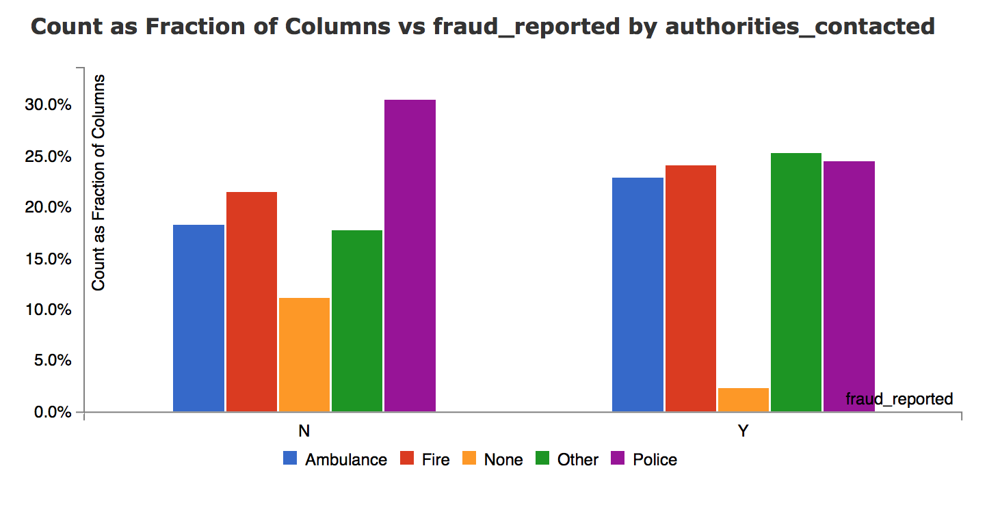

By observing the claims given the hour of the day, there is an increase of the regular claims during rush hour between 8:00am and 9:00am then we see a decline with an increse around lunch hour, then they decrease just to pick again between 4:00pm and 5:00pm. We can consider this a regular behavior for working people. On the other hand we can see that for the claims that were frauds the number of claims decreses during rush hour between 8:00am and 9:00am and between 4:00pm and 5:00pm. We see an increase of fraud claims between 9:00am and 11:00am, it decreases at noon and then there is an increase again between 2:00pm and 5:00pm.  

In [62]:
from pivottablejs import pivot_ui
pivot_ui(claims)

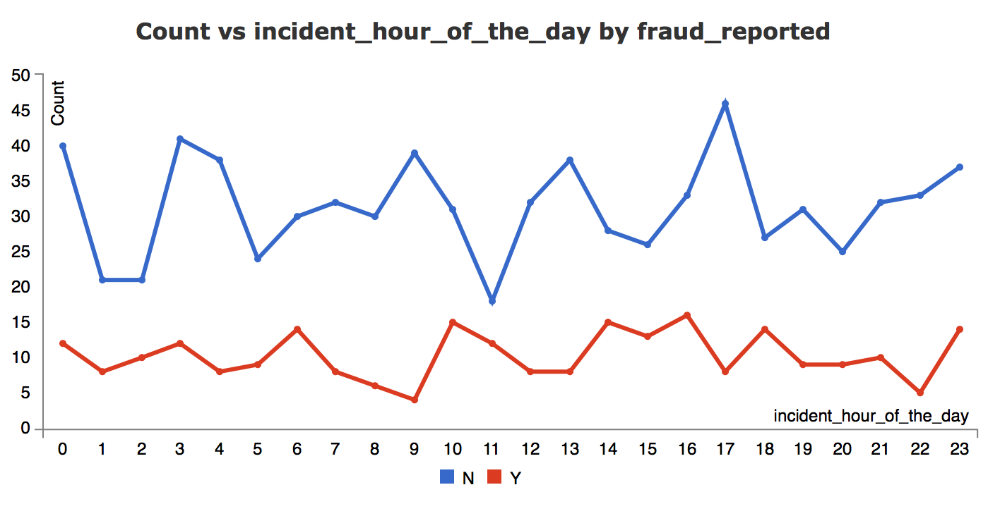

There is a clear disparity between claims that were reported as fraud and the ones that not in terms of incident severity. We can see that that for regular claims, the majority of the claims are considered minor damage (42%) and the second higher category will be total loss (32.4%). For the fraudulent claims, we see that the grand mayority of the claims are considered major damage (67.6%), minor damage (15.4%) and total loss (14.6%). 

In [69]:
from pivottablejs import pivot_ui
pivot_ui(claims)

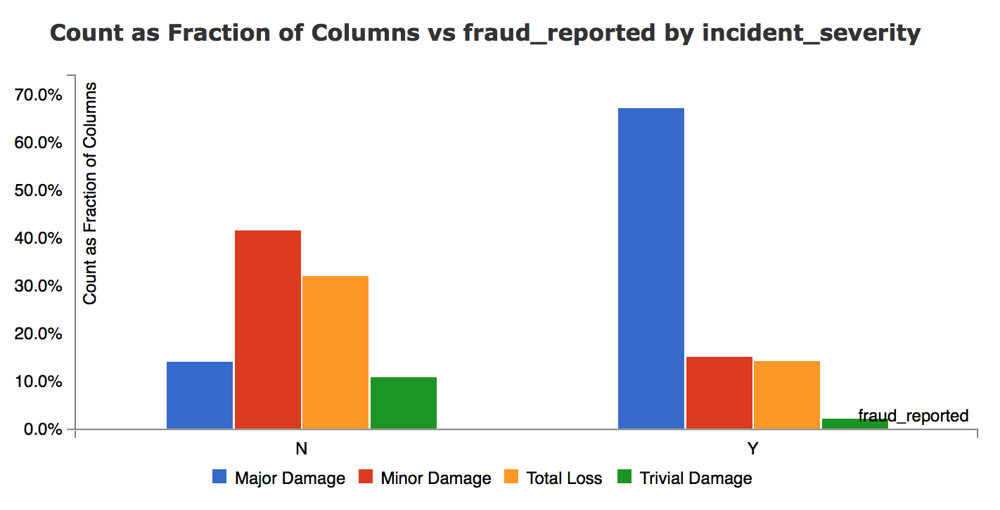

The two major incident types of claims in terms of amount of money paid on vehicle claims are single vehicle collision and multi-vehicle collision. 

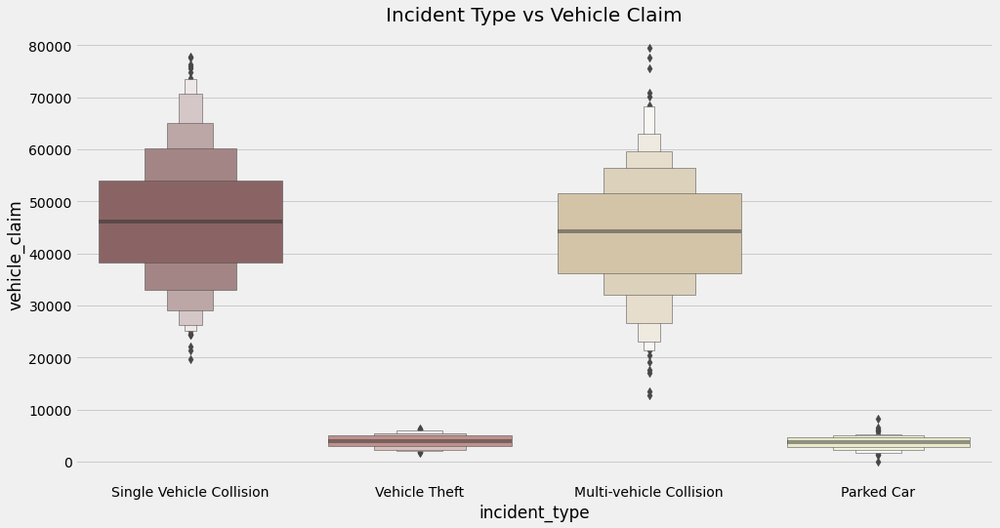

In [73]:
import warnings

warnings.filterwarnings('ignore')
plt.style.use('fivethirtyeight')
plt.rcParams['figure.figsize'] = (15, 8)

sns.boxenplot(claims['incident_type'], claims['vehicle_claim'], palette = 'pink')
plt.title('Incident Type vs Vehicle Claim', fontsize = 20)
plt.show();

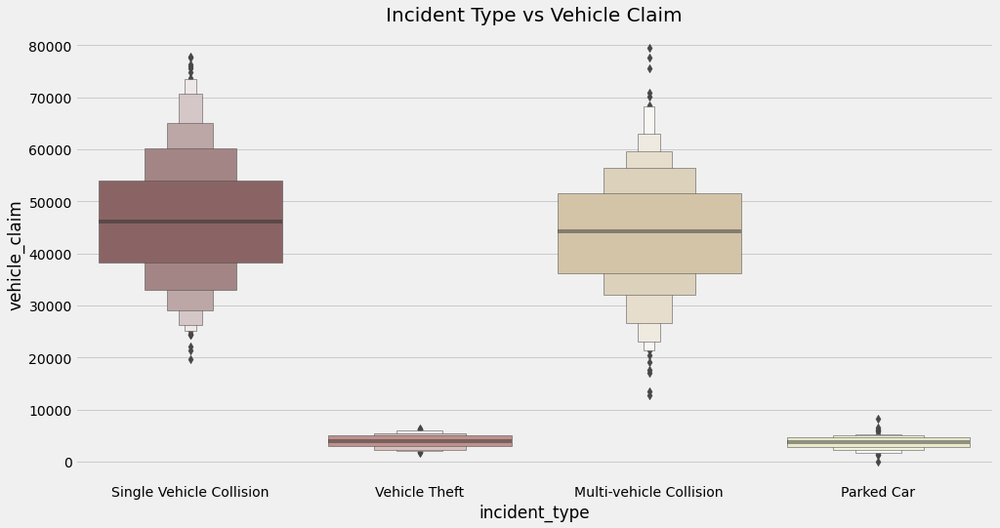

When trying to identify how fraud claims are disttibuted by the vehicle auto make, we can see that fraud claims have less variance across all auto make brands than the non fraud claims. Toyota non fraud claims present the wider spread of vehicle claims amounts of all the auto make brands available.

In [89]:
import plotly.express as px

df = px.data.tips()

fig = px.box(claims, x='auto_make', y='vehicle_claim', color='fraud_reported')
fig.update_traces(quartilemethod="exclusive") # or "inclusive", or "linear" by default
fig.show()

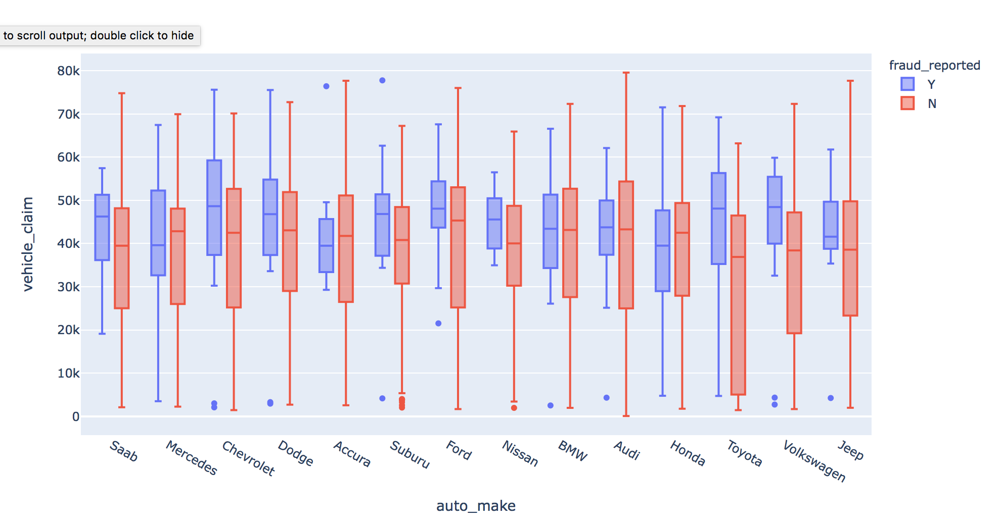

Fraud claims by incident type are less common for acidents where the car was parked and when the incident involved a vehicle theft. They seem to happen in similar proportions for incidents involving single vehicle collision and multi-vehicle collision

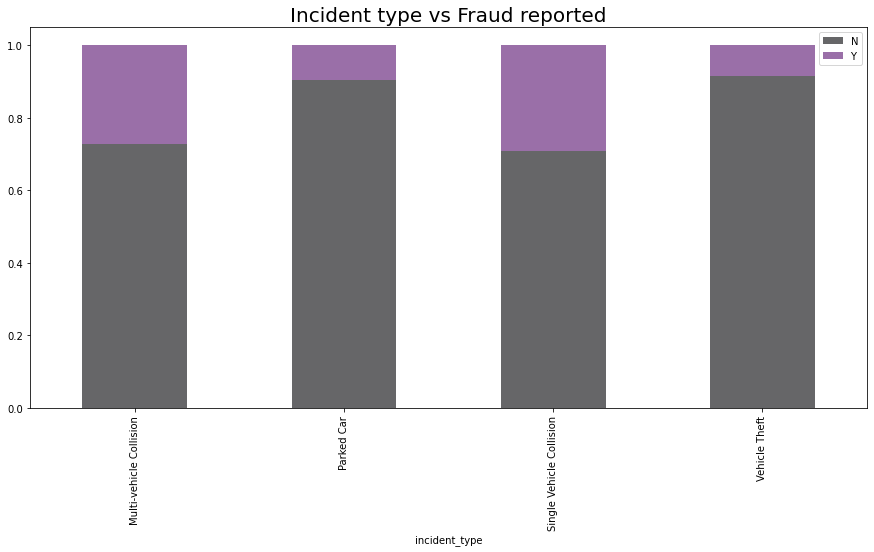

In [ ]:
incident = pd.crosstab(claims['incident_type'], claims['fraud_reported'])
colors = plt.cm.inferno(np.linspace(0, 1, 5))
incident.div(incident.sum(1).astype(float), axis = 0).plot(kind = 'bar',
                                                           stacked = True,
                                                           figsize = (15, 7),
                                                           color = colors, alpha=.6)

plt.title('Incident type vs Fraud reported', fontsize = 20)
plt.legend()
plt.show()

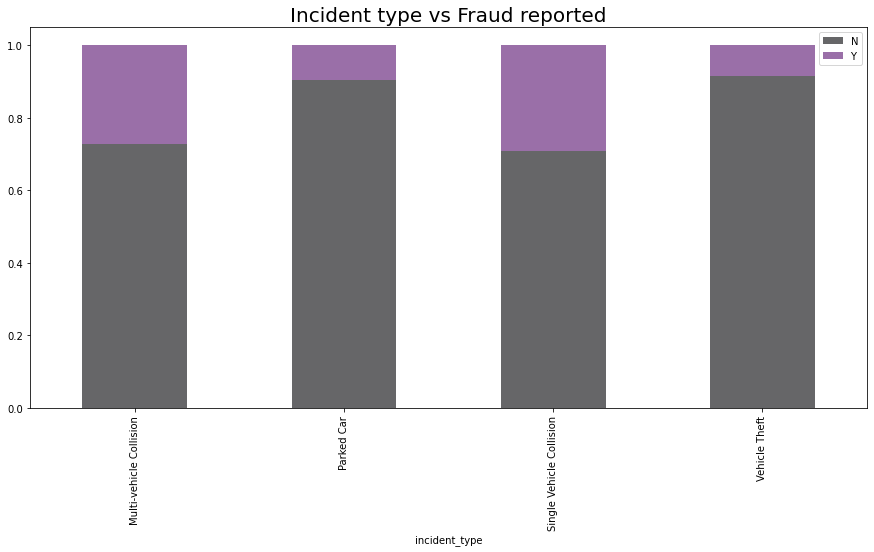

# <a name="Feature_Transformation"></a>**Feature Transformation**



In this section, some features get transformed to facilitate the modeling process.

In [30]:
from sklearn_pandas import DataFrameMapper

In [31]:
import pandas as pd
import numpy as np
import sklearn.preprocessing, sklearn.decomposition,sklearn.linear_model, sklearn.pipeline, sklearn.metrics
from sklearn.feature_extraction.text import CountVectorizer

The feature auto year and incident hour of the day will be modified by grouping then in to less categories with the idea of adding more interpretability to the model.

In [32]:
claims['auto_year_b']=pd.cut(x=claims['auto_year'], bins=[0,2000,2005,2010,2011,2012,2013,2014,2015], 
                        labels=['95-00', '01-05', '06-10','2011','2012','2013','2014','2015'])

In [33]:
claims['incident_hour_of_the_day_b']=pd.cut(x=claims['incident_hour_of_the_day'], bins=[-1,2,5,8,11,14,17,20,23], 
                        labels=['0-2', '3-5', '6-8','9-11','12-14','15-17','18-20','21-23'])

From the features policy bind date and incident date I extracted the year, month, and weekday and created these extra features. Specically for the month I grouped the incidents by season of the year (summer, winter, spring and fall).

In [35]:
from datetime import date
#Transform string to date
claims['policy_bind_date_d']=pd.to_datetime(claims.policy_bind_date, format="%d-%m-%Y")

claims['incident_date_d']=pd.to_datetime(claims.incident_date, format="%d-%m-%Y")

#Extracting Year
claims['policy_bind_year']=claims['policy_bind_date_d'].dt.year

claims['incident_year']=claims['incident_date_d'].dt.year

#Extracting Month

claims['policy_bind_month']=claims['policy_bind_date_d'].dt.month

claims['incident_month']=claims['incident_date_d'].dt.month


#Extracting the weekday name of the date

claims['policy_bind_weekday']=claims['policy_bind_date_d'].dt.day_name()

claims['incident_weekday']=claims['incident_date_d'].dt.day_name()



In [36]:
claims['incident_winter'] = claims['incident_month'].map(lambda x: x in [12, 1, 2]).astype('int32')
claims['incident_spring'] = claims['incident_month'].map(lambda x: x in [3, 4, 5]).astype('int32')
claims['incident_summer'] = claims['incident_month'].map(lambda x: x in [6, 7, 8]).astype('int32')
claims['incident_autumn'] = claims['incident_month'].map(lambda x: x in [9, 10, 11]).astype('int32')

In [37]:

claims['policy_bind_weekday']=claims.policy_bind_weekday.astype('object')
claims['incident_weekday']=claims.incident_weekday.astype('object')
claims['incident_winter']=claims.incident_winter.astype('object')
claims['incident_spring']=claims.incident_spring.astype('object')
claims['incident_summer']=claims.incident_summer.astype('object')
claims['incident_autumn']=claims.incident_autumn.astype('object') 

In [38]:
claims['policy_bind_year']=claims.policy_bind_year.astype('object')
claims['incident_year']=claims.incident_year.astype('object')
claims['policy_bind_month']=claims.policy_bind_month.astype('object')



For the incident location, I will only consider the street name. For that reason I will remove the house number of the incident location column.

In [39]:
claims['incident_location']

0           9935 4th Drive
1             6608 MLK Hwy
2        7121 Francis Lane
3         6956 Maple Drive
4             3041 3rd Ave
              ...         
995     6045 Andromedia St
996       3092 Texas Drive
997            7629 5th St
998          6128 Elm Lane
999    1416 Cherokee Ridge
Name: incident_location, Length: 1000, dtype: object

In [40]:

claims['incident_location_street']=claims['incident_location'].str[5:]


In [41]:
print(claims['incident_location_street'].unique())

['4th Drive' 'MLK Hwy' 'Francis Lane' 'Maple Drive' '3rd Ave'
 'Washington St' 'Weaver Drive' '3rd Hwy' 'Rock Ridge' 'Francis Ave'
 '1st Ridge' '5th Hwy' '5th Drive' 'Elm Lane' '3rd Drive' 'Weaver Ave'
 '3rd St' 'Tree St' 'Solo Ridge' '3rd Ridge' 'Pine St' 'Embaracadero Ave'
 'Apache Hwy' 'Texas Lane' 'Elm St' 'Andromedia Hwy' 'Rock Drive'
 'Francis Drive' '2nd Lane' '5th Ave' 'Britain Ridge' 'Maple St'
 'Sky Drive' 'Weaver St' 'Tree Lane' 'Embaracadero St' 'Flute St'
 'Lincoln Hwy' 'MLK Drive' 'Oak Drive' 'Cherokee Lane' '4th St' 'Tree Ave'
 'Flute Ave' 'Britain St' '4th Ave' 'Elm Drive' 'MLK Ridge' '2nd St'
 'Best Drive' '4th Hwy' 'Britain Ave' 'Pine Hwy' '1st St' 'Cherokee Drive'
 'Washington Ave' 'Flute Drive' 'Sky Hwy' 'Pine Ridge' 'Oak Ave'
 'Washington Ridge' 'Maple Hwy' 'Texas Ridge' 'Elm Ave' 'Best Lane'
 'Tree Drive' 'Best St' 'Sky Lane' 'Oak Hwy' 'Maple Lane' '5th Lane'
 'Apache Ave' 'Sky St' 'Britain Hwy' 'Solo Lane' 'Solo Hwy'
 'Britain Drive' 'Andromedia St' '2nd Hwy' 'ML

In [42]:
claims.policy_deductable

0      1000
1      2000
2      2000
3      2000
4      1000
       ... 
995    1000
996    1000
997     500
998    2000
999    1000
Name: policy_deductable, Length: 1000, dtype: category
Categories (3, int64): [500, 1000, 2000]

In [43]:
# pandas drop columns using list of column names
X=claims.copy()
X=X.drop(['fraud_reported', 'policy_bind_date', 'incident_date','auto_year','incident_hour_of_the_day','policy_bind_date_d','incident_date_d','incident_location','policy_number','incident_month'], axis=1)



In [44]:
y=claims['fraud_reported']

In [45]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 44 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   months_as_customer           1000 non-null   int64   
 1   age                          1000 non-null   int64   
 2   policy_state                 1000 non-null   object  
 3   policy_csl                   1000 non-null   object  
 4   policy_deductable            1000 non-null   category
 5   policy_annual_premium        1000 non-null   float64 
 6   umbrella_limit               1000 non-null   int64   
 7   insured_zip                  1000 non-null   int64   
 8   insured_sex                  1000 non-null   object  
 9   insured_education_level      1000 non-null   object  
 10  insured_occupation           1000 non-null   object  
 11  insured_hobbies              1000 non-null   object  
 12  insured_relationship         1000 non-null   object  
 13  capi

<font color='teal'>**Feature standarization and One HotEncoder**

In [46]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder,LabelBinarizer


In [47]:
X_cat=X.select_dtypes('object')
X_cat.columns

Index(['policy_state', 'policy_csl', 'insured_sex', 'insured_education_level',
       'insured_occupation', 'insured_hobbies', 'insured_relationship',
       'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'property_damage', 'police_report_available', 'auto_make', 'auto_model',
       'policy_bind_year', 'incident_year', 'policy_bind_month',
       'policy_bind_weekday', 'incident_weekday', 'incident_winter',
       'incident_spring', 'incident_summer', 'incident_autumn',
       'incident_location_street'],
      dtype='object')

In [48]:
X_flt=X.select_dtypes('float64')
X_flt.columns

Index(['policy_annual_premium'], dtype='object')

In [49]:
X_flt=X.select_dtypes('int64')
X_flt.columns

Index(['months_as_customer', 'age', 'umbrella_limit', 'insured_zip',
       'capital-gains', 'capital-loss', 'number_of_vehicles_involved',
       'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim',
       'property_claim', 'vehicle_claim'],
      dtype='object')

In [50]:
# Define which columns should be scaled  (NUMERIC)
columns_to_scale  =['policy_annual_premium','months_as_customer', 'age', 'umbrella_limit', 'insured_zip',
       'capital-gains', 'capital-loss', 'number_of_vehicles_involved',
       'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim',
       'property_claim', 'vehicle_claim']

#['months_as_customer', 'age', 'policy_number', 'umbrella_limit','insured_zip', 'capital-gains', 'capital-loss','number_of_vehicles_involved', 'bodily_injuries', 'witnesses','total_claim_amount', 'injury_claim', 'property_claim','vehicle_claim','incident_month']



In [51]:
# Define which columns should be encoded  (CATEGORIC)
columns_to_encode = ['policy_state', 'policy_csl', 'insured_sex', 'insured_education_level',
       'insured_occupation', 'insured_hobbies', 'insured_relationship',
       'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'property_damage', 'police_report_available', 'auto_make', 'auto_model',
       'policy_bind_year', 'incident_year', 'policy_bind_month',
       'policy_bind_weekday', 'incident_weekday', 'incident_winter',
       'incident_spring', 'incident_summer', 'incident_autumn',
       'incident_location_street']


#['policy_annual_premium','policy_state', 'policy_csl', 'insured_sex', 'insured_education_level','insured_occupation', 'insured_hobbies', 'insured_relationship','incident_type', 'collision_type', 'incident_severity','authorities_contacted', 'incident_state', 'incident_city','property_damage', 'police_report_available', 'auto_make', 'auto_model','policy_bind_year', 'incident_year', 'policy_bind_month', 'policy_bind_weekday', 'incident_weekday', 'incident_location_street']




First we scale the data on the training set.

In [52]:
# Instantiate encoder/scaler
from numpy import asarray
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
ohe    = OneHotEncoder(sparse=False,categories='auto')

In [53]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.25)

In [54]:
# Scale and Encode Separate Columns
Xt_scaled  = scaler.fit_transform(X_train[columns_to_scale]) 


In [55]:
#I will combine the train and test sets and  apply OneHotEncoder on both at the same time.
X_train_cat=X_train[columns_to_encode]
X_test_cat=X_test[columns_to_encode]

#I create a Variable that tells us if the data corresponds to the Training set or the Testing set.
X_train_cat['train']=1
X_test_cat['train']=0

#I combine the datasets to encode them
df=pd.concat([X_train_cat,X_test_cat])


In [56]:
#I apply the OneHotEncoder to the combined Dataset#

df_ohc=ohe.fit_transform(df[columns_to_encode])


In [57]:
df_ohc_f=pd.DataFrame(df_ohc)

In [58]:
combined=pd.concat([df_ohc_f,df['train']],axis=1)


In [59]:
X_train_encoded=combined[combined['train']==1]
X_test_encoded=combined[combined['train']==0]

X_train_encoded.drop(['train'],axis=1,inplace=True)
X_test_encoded.drop(['train'],axis=1,inplace=True)

In [60]:
# Concatenate (Column-Bind) Processed Columns Back Together
X_train_scaled=[]
X_train_scaled= np.concatenate([Xt_scaled, X_train_encoded], axis=1)


Then we scale the Test set based on the training set.

In [61]:
##Important to scale based on the training data scaler to avoid data liking


Xtest_scaled  = scaler.transform(X_test[columns_to_scale]) 



In [62]:
# Concatenate (Column-Bind) Processed Columns Back Together
X_test_scaled=[]
X_test_scaled = np.concatenate([Xtest_scaled, X_test_encoded], axis=1)

In [64]:
#Test to check that two Datasets have the same number of columns.
train=pd.DataFrame(X_train_encoded)
test=pd.DataFrame(X_test_encoded)
train_cols=list(train.columns)
test_cols=list(test.columns)
cols_not_in_test={c:0 for c in train_cols if c not in test_cols}
#test=test.assign(**cols_not_in_test)
print(cols_not_in_test)

{}



# <a name="Modeling_section"></a>**Modeling**

This is an imbalance data set, due to the fact the claims that are considered fraud are less represented than the non fraud claims. To try to fix this issue I wil over-sample by incresing the amount of these rare claims. I will use a technique called SMOTE (Synthetic Minority Over-Samling Technique).

In [65]:
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
#from sklearn.grid_search import GridSearchCV
from sklearn.metrics import accuracy_score
#from sklearn.learning_curve import validation_curve
from sklearn.model_selection import validation_curve
from sklearn.model_selection import learning_curve

In [91]:
#from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import SMOTE 

In [88]:
y_train.describe()


count     750
unique      2
top         N
freq      575
Name: fraud_reported, dtype: object

In [71]:
from imblearn.over_sampling import SMOTENC

In [77]:
X_train_scaled_pd=pd.DataFrame(X_train_scaled)

In [81]:
X_train_scaled_pd.dtypes

0      float64
1      float64
2      float64
3      float64
4      float64
        ...   
366    float64
367    float64
368    float64
369    float64
370    float64
Length: 371, dtype: object

In [93]:
#for Over-sampling this imbalance dataset

sm = SMOTE(random_state=42)

X_train_sm, y_train_sm = sm.fit_resample(X_train_scaled, y_train)


In [97]:
y_train_sm.value_counts()

N    575
Y    575
Name: fraud_reported, dtype: int64

In [98]:
y_train.value_counts()

N    575
Y    175
Name: fraud_reported, dtype: int64

In [69]:
y_train.describe()

count     750
unique      2
top         N
freq      564
Name: fraud_reported, dtype: object

In [70]:
pd.DataFrame(y_train_sm).describe()

,0
count,1128
unique,2
top,Y
freq,564


In all the models that I will analyze, I will use this over-sampled training data.

# <font color='teal'> Random Forest

The first model that I am going to study is Random Forest. I will use the Over-sampling training database.

In [71]:
#Model with SMOTE over-sampling

from sklearn.ensemble import RandomForestClassifier

#Apply RF to the training data:

rf_sm = RandomForestClassifier(bootstrap=True,n_estimators=100,criterion='entropy')
rf_sm.fit(X_train_sm, y_train_sm)

#Predict using the model:

y_predict_rf_sm = rf_sm.predict(X_test_scaled)
y_train_predict_rf_sm = rf_sm.predict(X_train_sm)
#Confusion matrix:

cnf_matrix_rf_sm = confusion_matrix(y_test, y_predict_rf_sm)
print(cnf_matrix_rf_sm)
Accuracy_rf_sm=rf_sm.score(X_test_scaled,y_test)
print(Accuracy_rf_sm)

[[188   1]
 [ 59   2]]
0.76


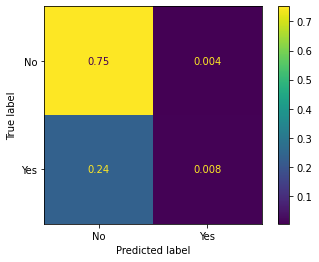

In [72]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

#cm = confusion_matrix(y_test, y_predict_rf)
cm = confusion_matrix(y_test, y_predict_rf_sm, normalize='all')
cmd = ConfusionMatrixDisplay(cm, display_labels=['No','Yes'])
cmd.plot()

In [73]:
#This is a function to get the confusion  Matrix, formated.
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
#Got this function from: https://github.com/DTrimarchi10/confusion_matrix/blob/master/cf_matrix.py

def make_confusion_matrix(cf,
                          group_names=None,
                          categories='auto',
                          count=True,
                          percent=True,
                          cbar=True,
                          xyticks=True,
                          xyplotlabels=True,
                          sum_stats=True,
                          figsize=None,
                          cmap='Blues',
                          title=None):
    '''
    This function will make a pretty plot of an sklearn Confusion Matrix cm using a Seaborn heatmap visualization.
    Arguments
    ---------
    cf:            confusion matrix to be passed in
    group_names:   List of strings that represent the labels row by row to be shown in each square.
    categories:    List of strings containing the categories to be displayed on the x,y axis. Default is 'auto'
    count:         If True, show the raw number in the confusion matrix. Default is True.
    normalize:     If True, show the proportions for each category. Default is True.
    cbar:          If True, show the color bar. The cbar values are based off the values in the confusion matrix.
                   Default is True.
    xyticks:       If True, show x and y ticks. Default is True.
    xyplotlabels:  If True, show 'True Label' and 'Predicted Label' on the figure. Default is True.
    sum_stats:     If True, display summary statistics below the figure. Default is True.
    figsize:       Tuple representing the figure size. Default will be the matplotlib rcParams value.
    cmap:          Colormap of the values displayed from matplotlib.pyplot.cm. Default is 'Blues'
                   See http://matplotlib.org/examples/color/colormaps_reference.html
                   
    title:         Title for the heatmap. Default is None.
    '''


    # CODE TO GENERATE TEXT INSIDE EACH SQUARE
    blanks = ['' for i in range(cf.size)]

    if group_names and len(group_names)==cf.size:
        group_labels = ["{}\n".format(value) for value in group_names]
    else:
        group_labels = blanks

    if count:
        group_counts = ["{0:0.0f}\n".format(value) for value in cf.flatten()]
    else:
        group_counts = blanks

    if percent:
        group_percentages = ["{0:.2%}".format(value) for value in cf.flatten()/np.sum(cf)]
    else:
        group_percentages = blanks

    box_labels = [f"{v1}{v2}{v3}".strip() for v1, v2, v3 in zip(group_labels,group_counts,group_percentages)]
    box_labels = np.asarray(box_labels).reshape(cf.shape[0],cf.shape[1])


    # CODE TO GENERATE SUMMARY STATISTICS & TEXT FOR SUMMARY STATS
    if sum_stats:
        #Accuracy is sum of diagonal divided by total observations
        accuracy  = np.trace(cf) / float(np.sum(cf))

        #if it is a binary confusion matrix, show some more stats
        if len(cf)==2:
            #Metrics for Binary Confusion Matrices
            precision = cf[1,1] / sum(cf[:,1])
            recall    = cf[1,1] / sum(cf[1,:])
            f1_score  = 2*precision*recall / (precision + recall)
            stats_text = "\n\nAccuracy={:0.3f}\nPrecision={:0.3f}\nRecall={:0.3f}\nF1 Score={:0.3f}".format(
                accuracy,precision,recall,f1_score)
        else:
            stats_text = "\n\nAccuracy={:0.3f}".format(accuracy)
    else:
        stats_text = ""


    # SET FIGURE PARAMETERS ACCORDING TO OTHER ARGUMENTS
    if figsize==None:
        #Get default figure size if not set
        figsize = plt.rcParams.get('figure.figsize')

    if xyticks==False:
        #Do not show categories if xyticks is False
        categories=False


    # MAKE THE HEATMAP VISUALIZATION
    plt.figure(figsize=figsize)
    sns.heatmap(cf,annot=box_labels,fmt="",cmap=cmap,cbar=cbar,xticklabels=categories,yticklabels=categories)

    if xyplotlabels:
        plt.ylabel('True label')
        plt.xlabel('Predicted label' + stats_text)
    else:
        plt.xlabel(stats_text)
    
    if title:
        plt.title(title)

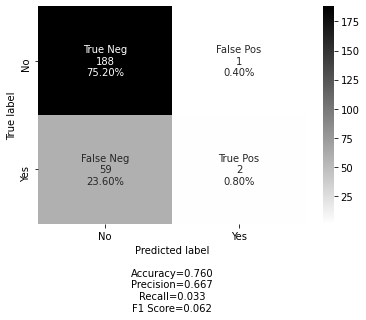

In [74]:
labels = ['True Neg','False Pos','False Neg','True Pos']
categories = ['No', 'Yes']
make_confusion_matrix(cnf_matrix_rf_sm, group_names=labels,categories=categories,cmap='binary')

In [75]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_predict_rf_sm))
             

              precision    recall  f1-score   support

           N       0.76      0.99      0.86       189
           Y       0.67      0.03      0.06        61

    accuracy                           0.76       250
   macro avg       0.71      0.51      0.46       250
weighted avg       0.74      0.76      0.67       250



In [76]:
from sklearn.model_selection import cross_val_score


cv_scores_sm_test= cross_val_score(rf_sm,X_test_scaled,y_test,cv=5,scoring='roc_auc')
cv_scores_sm_train= cross_val_score(rf_sm,X_train_sm,y_train_sm,cv=5,scoring='roc_auc')
print(cv_scores_sm_test)
cv_scores_rf_sm_test= cv_scores_sm_test.mean()
cv_scores_rf_sm_train= cv_scores_sm_train.mean()
cv_scores_std_rf_sm= cv_scores_sm_test.std()
print ('Mean cross validation test score: ' +str(cv_scores_rf_sm_test))
print ('Mean cross validation train score: ' +str(cv_scores_rf_sm_train))
print ('Standard deviation in cv scores: ' +str(cv_scores_std_rf_sm))

[0.72587719 0.57346491 0.39254386 0.52960526 0.48232848]
Mean cross validation test score: 0.5407639420797316
Mean cross validation train score: 0.9357818321157267
Standard deviation in cv scores: 0.11031290134813493


Now I will calculate the Random forest model without SMOTE over-sampling.

In [77]:
#NO SMOTE over-sampling

#Apply RF to the training data:

rf = RandomForestClassifier(bootstrap=True,n_estimators=100,criterion='entropy')
rf.fit(X_train_scaled, y_train)

#Predict using the model:

y_test_predict_rf = rf.predict(X_test_scaled)
y_train_predict_rf = rf.predict(X_train_scaled)
#Confusion matrix:

cnf_matrix_rf = confusion_matrix(y_test, y_test_predict_rf)
print(cnf_matrix_rf)
Accuracy_rf=rf.score(X_test_scaled,y_test)
print(Accuracy_rf)

[[189   0]
 [ 61   0]]
0.756


**Precision-Recall Chart for both SMOTE and non SMOTE samples.**



> Precision Recall for baseline Random Forest (non SMOTE)



In [78]:
#from object_detection.utils.metrics import compute_precision_recall
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score
from sklearn.metrics import auc

To calculate the prediction-recall values I need to convert the y_train and y_test and prediction values to numeric. Replace No for 0 and Yes for 1

In [79]:
#Replace to numeric the prediction values
y_test_predict_rf_num=pd.DataFrame(y_test_predict_rf).replace(to_replace=['N','Y'],value=[0,1])
y_train_predict_rf_num=pd.DataFrame(y_train_predict_rf).replace(to_replace=['N','Y'],value=[0,1])


In [80]:
#Replace to numeric the prediction values
y_test_num=pd.DataFrame(y_test).replace(to_replace=['N','Y'],value=[0,1])
y_train_num=pd.DataFrame(y_train).replace(to_replace=['N','Y'],value=[0,1])

In [81]:
#Precision recall for baseline Random Forest model

precision_test_rf, recall_test_rf, thresholds_test_rf = precision_recall_curve(y_test_num, y_test_predict_rf_num)
pr_auc_test_rf = auc(recall_test_rf, precision_test_rf)

precision_train_rf, recall_train_rf, thresholds_teain_rf = precision_recall_curve(y_train_num,y_train_predict_rf_num)
pr_auc_train_rf = auc(recall_train_rf, precision_train_rf)


> Precision Recall for SMOTE Random Forest 

In [82]:
#Replace to numeric in the prediction values

y_test_predict_rf_sm_num=pd.DataFrame(y_predict_rf_sm).replace(to_replace=['N','Y'],value=[0,1])
y_train_predict_rf_sm_num=pd.DataFrame(y_train_predict_rf_sm).replace(to_replace=['N','Y'],value=[0,1])

y_train_sm_num=pd.DataFrame(y_train_sm).replace(to_replace=['N','Y'],value=[0,1])

In [83]:
#Precision recall for baseline Random Forest model

precision_test_rf_sm, recall_test_rf_sm, thresholds_test_rf_sm = precision_recall_curve(y_test_num, y_test_predict_rf_sm_num)
pr_auc_test_rf_sm = auc(recall_test_rf_sm, precision_test_rf_sm)

precision_train_rf_sm, recall_train_rf_sm, thresholds_teain_rf_sm= precision_recall_curve(y_train_sm_num,y_train_predict_rf_sm_num)
pr_auc_train_rf_sm = auc(recall_train_rf_sm, precision_train_rf_sm)

Precision Recall Chart

In [84]:
colors = plt.cm.inferno(np.linspace(0, 1, 5))

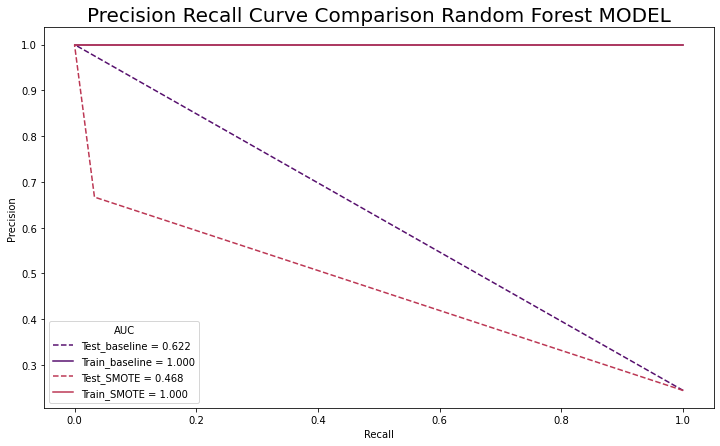

In [85]:
_ = plt.figure(figsize=(12,7))
_ = plt.title('Precision Recall Curve Comparison Random Forest MODEL', size=20)
_ = plt.plot(recall_test_rf, precision_test_rf, label = 'Test_baseline = %0.3f' % pr_auc_test_rf,color=colors[1], linestyle='--')
_ = plt.plot(recall_train_rf,precision_train_rf, label = 'Train_baseline = %0.3f' % pr_auc_train_rf,color=colors[1])
_ = plt.plot(recall_test_rf_sm,precision_test_rf_sm, label = 'Test_SMOTE = %0.3f' % pr_auc_test_rf_sm,color=colors[2], linestyle='--')
_ = plt.plot(recall_train_rf_sm,precision_train_rf_sm, label = 'Train_SMOTE = %0.3f' % pr_auc_train_rf_sm,color=colors[2])


#_ = plt.plot(recallxg, precisionxg, label = 'XGBoost = %0.3f' % pr_aucxg)
_ = plt.ylabel('Precision')
_ = plt.xlabel('Recall')
_ = plt.legend(title='AUC')
_ = plt.show()

# <font color='teal'> Naive Bayes

Now I will test this model with the **SMOTE** technique for over-sampling

In [204]:
#This is the data used for the over-sampling analysis: X_train_sm,y_train_sm
from sklearn.naive_bayes import GaussianNB
nb_sm= GaussianNB()
nb_sm.fit(X_train_sm,y_train_sm)
#Predict using the model:

y_test_predict_nb_sm=nb_sm.predict(X_test_scaled)
y_train_predict_nb_sm=nb_sm.predict(X_train_sm)

#Confusion matrix:

nb_cnf_matrix_sm = confusion_matrix(y_test, y_test_predict_nb_sm)
print(nb_cnf_matrix_sm)
Accuracy_nb_sm=nb_sm.score(X_test_scaled,y_test)
print(Accuracy_nb_sm)

[[ 74 118]
 [ 20  38]]
0.448


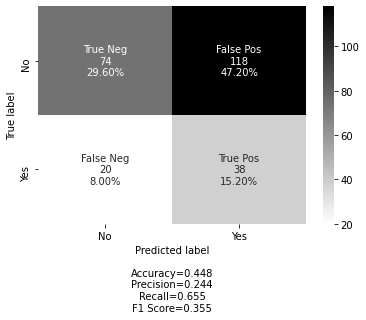

In [205]:
labels = ['True Neg','False Pos','False Neg','True Pos']
categories = ['No', 'Yes']
make_confusion_matrix(nb_cnf_matrix_sm, group_names=labels,categories=categories,cmap='binary')

In [206]:


cv_scores_test= cross_val_score(nb_sm,X_test_scaled,y_test,cv=5,scoring='roc_auc')

cv_scores_train= cross_val_score(nb_sm,X_train_sm,y_train_sm,cv=5,scoring='roc_auc')
print(cv_scores_test)
cv_scores_nb_test_sm= cv_scores_test.mean()
cv_scores_nb_train_sm= cv_scores_train.mean()
cv_scores_std_nb_sm= cv_scores_test.std()
print ('Mean cross validation test score: ' +str(cv_scores_nb_test_sm))
print ('Mean cross validation train score: ' +str(cv_scores_nb_train_sm))
print ('Standard deviation in cv scores: ' +str(cv_scores_std_nb_sm))

[0.40131579 0.375      0.42982456 0.58624709 0.50932401]
Mean cross validation test score: 0.4603422892896577
Mean cross validation train score: 0.6289239145027578
Standard deviation in cv scores: 0.07739508063368458


Now I will calculate the Naive Bayes model without SMOTE over-sampling.

In [207]:
#Baseline model
nb = GaussianNB()
nb.fit(X_train_scaled,y_train)

#Predict using the model:

y_test_predict_nb=nb.predict(X_test_scaled)
y_train_predict_nb=nb_sm.predict(X_train_scaled)

#Confusion matrix:

cnf_matrix = confusion_matrix(y_test, y_test_predict_nb)
print(cnf_matrix)
Accuracy_nb=nb.score(X_test_scaled,y_test)
print(Accuracy_nb)

[[ 67 125]
 [ 17  41]]
0.432


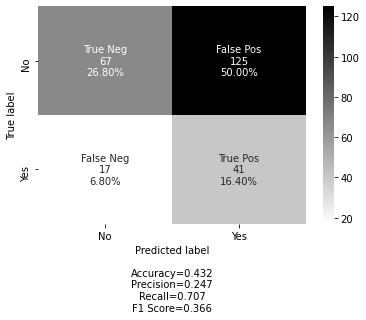

In [208]:
labels = ['True Neg','False Pos','False Neg','True Pos']
categories = ['No', 'Yes']
make_confusion_matrix(cnf_matrix, group_names=labels,categories=categories,cmap='binary')

In [209]:
#from sklearn.cross_validation import cross_val_score
from sklearn.model_selection import cross_val_score

cv_scores_test= cross_val_score(nb,X_test_scaled,y_test,cv=5,scoring='roc_auc')
cv_scores_train= cross_val_score(nb,X_train_scaled,y_train,cv=5,scoring='roc_auc')
print(cv_scores_test)
cv_scores_nb_test= cv_scores_test.mean()
cv_scores_nb_train= cv_scores_train.mean()
cv_scores_std_nb= cv_scores_test.std()
print ('Mean cross validation test score: ' +str(cv_scores_nb_test))
print ('Mean cross validation train score: ' +str(cv_scores_nb_train))
print ('Standard deviation in cv scores: ' +str(cv_scores_std_nb))

[0.40131579 0.375      0.42982456 0.58624709 0.50932401]
Mean cross validation test score: 0.4603422892896577
Mean cross validation train score: 0.5291126794503599
Standard deviation in cv scores: 0.07739508063368458


Precision-Recall.


> Precision Recall for baseline Naive Bayes (non SMOTE)

In [210]:
#Replace to numeric the prediction values
y_test_predict_nb_num=pd.DataFrame(y_test_predict_nb).replace(to_replace=['N','Y'],value=[0,1])
y_train_predict_nb_num=pd.DataFrame(y_train_predict_nb).replace(to_replace=['N','Y'],value=[0,1])

In [211]:
#Precision recall for baseline Naive Bayes model

precision_test_nb, recall_test_nb, thresholds_test_nb = precision_recall_curve(y_test_num, y_test_predict_nb_num)
pr_auc_test_nb = auc(recall_test_nb, precision_test_nb)

precision_train_nb, recall_train_nb, thresholds_teain_nb = precision_recall_curve(y_train_num,y_train_predict_nb_num)
pr_auc_train_nb = auc(recall_train_nb, precision_train_nb)

>Precision Recall for SMOTE Naive Bayes

In [212]:
#Replace to numeric in the prediction values

y_test_predict_nb_sm_num=pd.DataFrame(y_test_predict_nb_sm).replace(to_replace=['N','Y'],value=[0,1])
y_train_predict_nb_sm_num=pd.DataFrame(y_train_predict_nb_sm).replace(to_replace=['N','Y'],value=[0,1])


In [213]:
#Precision recall for SMOTE Logistic regression model

precision_test_nb_sm, recall_test_nb_sm, thresholds_test_nb_sm = precision_recall_curve(y_test_num, y_test_predict_nb_sm_num)
pr_auc_test_nb_sm = auc(recall_test_nb_sm, precision_test_nb_sm)

precision_train_nb_sm, recall_train_nb_sm, thresholds_teain_nb_sm = precision_recall_curve(y_train_sm_num,y_train_predict_nb_sm_num)
pr_auc_train_nb_sm = auc(recall_train_nb_sm, precision_train_nb_sm)

**Precision Recall Chart**

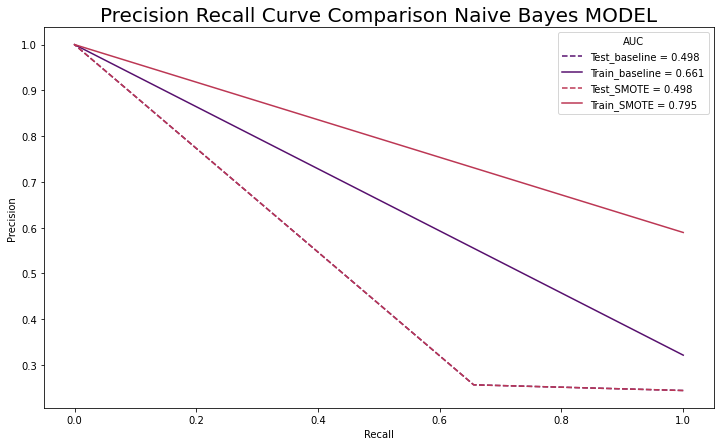

In [105]:
_ = plt.figure(figsize=(12,7))
_ = plt.title('Precision Recall Curve Comparison Naive Bayes MODEL', size=20)
_ = plt.plot(recall_test_nb, precision_test_nb, label = 'Test_baseline = %0.3f' % pr_auc_test_nb,color=colors[1], linestyle='--')
_ = plt.plot(recall_train_nb,precision_train_nb, label = 'Train_baseline = %0.3f' % pr_auc_train_nb,color=colors[1])
_ = plt.plot(recall_test_nb_sm,precision_test_nb_sm, label = 'Test_SMOTE = %0.3f' % pr_auc_test_nb_sm,color=colors[2], linestyle='--')
_ = plt.plot(recall_train_nb_sm,precision_train_nb_sm, label = 'Train_SMOTE = %0.3f' % pr_auc_train_nb_sm,color=colors[2])


#_ = plt.plot(recallxg, precisionxg, label = 'XGBoost = %0.3f' % pr_aucxg)
_ = plt.ylabel('Precision')
_ = plt.xlabel('Recall')
_ = plt.legend(title='AUC')
_ = plt.show()

# <font color='teal'> Logistic Regression

I will test this model with the SMOTE technique for over-sampling

I will test different C values, C is the inverse regularization parameter - A control variable that retains strength modification of Regularization by being inversely positioned to the Lambda regulator.

Given how Scikit cites it as being:

C = 1/λ

λ is called the regularization parameter. It controls the trade-off between two goals: fitting the training data well vs keeping the params small to avoid overfitting.

In [108]:
#New Train dataset with the SMOTE technique

#X_train_sm, y_train_sm
C_param_range = [0.001,0.01,0.1,1,10,100]

table = pd.DataFrame(columns = ['C_parameter','Accuracy'])
table['C_parameter'] = C_param_range


j = 0
for i in C_param_range:
    
    # Apply logistic regression model to training data
    Logreg = LogisticRegression(penalty = 'l2', C = i,random_state = 40,max_iter=2000)
    Logreg.fit(X_train_sm,y_train_sm)
    
    # Predict using model
    y_test_pred_lr_sm = Logreg.predict(X_test_scaled)
    
    # Saving accuracy score in table
    table.iloc[j,1] = accuracy_score(y_test, y_test_pred_lr_sm)
    j += 1
    
table

,C_parameter,Accuracy
0,0.001,0.52
1,0.010,0.54
2,0.100,0.548
3,1.000,0.58
4,10.000,0.58
5,100.000,0.556


I select the C paraneter that produces the higher Accuracy. In this case is c=1

In [109]:
#The selected model is with C=1
Logreg_sm = LogisticRegression(penalty = 'l2', C = 1,random_state = 40,max_iter=2000)
Logreg_sm.fit(X_train_sm,y_train_sm)
# Predict using model
y_test_pred_lr_sm = Logreg_sm.predict(X_test_scaled)
y_train_pred_lr_sm = Logreg_sm.predict(X_train_sm)

In [110]:
cnf_matrix_sm= confusion_matrix(y_test,y_test_pred_lr_sm)
print(cnf_matrix_sm)
Accuracy_lr_sm=Logreg.score(X_test_scaled,y_test)

print(Accuracy_lr_sm)

[[126  63]
 [ 42  19]]
0.556


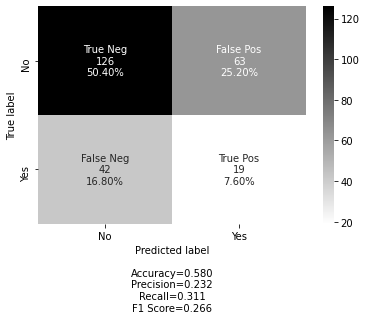

In [116]:
labels = ['True Neg','False Pos','False Neg','True Pos']
categories = ['No', 'Yes']
make_confusion_matrix(cnf_matrix_sm, group_names=labels,categories=categories,cmap='binary')

In [112]:
cv_scores_test_sm= cross_val_score(Logreg_sm,X_test_scaled,y_test,cv=5,scoring='roc_auc')
cv_scores_train_sm= cross_val_score(Logreg_sm,X_train_sm,y_train_sm,cv=5,scoring='roc_auc')
print(cv_scores_test_sm)
cv_scores_lr_test= cv_scores_test_sm.mean()
cv_scores_lr_train= cv_scores_train_sm.mean()
cv_scores_std_test_lr= cv_scores_test_sm.std()
print ('Mean cross validation test score (SMOTE): ' +str(cv_scores_lr_test))
print ('Mean cross validation train score(SMOTE): ' +str(cv_scores_lr_train))
print ('Standard deviation in cv test scores(SMOTE): ' +str(cv_scores_std_test_lr))

[0.56140351 0.63815789 0.37719298 0.5372807  0.44906445]
Mean cross validation test score (SMOTE): 0.5126199073567494
Mean cross validation train score(SMOTE): 0.7618449537384067
Standard deviation in cv test scores(SMOTE): 0.09069457435765554


Now I will calculate the Logistic regression model without SMOTE over-sampling.

In [113]:
C_param_range = [0.001,0.01,0.1,1,10,100]

table = pd.DataFrame(columns = ['C_parameter','Accuracy'])
table['C_parameter'] = C_param_range


j = 0
for i in C_param_range:
    
    # Apply logistic regression model to training data
    Logreg = LogisticRegression(penalty = 'l2', C = i,random_state = 40,max_iter=2000)
    Logreg.fit(X_train_scaled,y_train)
    
    # Predict using model
    y_pred_lr = Logreg.predict(X_test_scaled)
    
    # Saving accuracy score in table
    table.iloc[j,1] = accuracy_score(y_test,y_pred_lr)
    j += 1
    
table

,C_parameter,Accuracy
0,0.001,0.756
1,0.010,0.756
2,0.100,0.744
3,1.000,0.684
4,10.000,0.596
5,100.000,0.584


For this non-SMOTE model the C value that gives the highest Accuracy is C=0.01

In [115]:
Logreg = LogisticRegression(penalty = 'l2', C = 0.10,random_state = 40,max_iter=2000)
Logreg.fit(X_train_scaled,y_train)
# Predict using model
y_test_pred_lr = Logreg.predict(X_test_scaled)
y_train_pred_lr = Logreg.predict(X_train_scaled)


In [118]:
from sklearn.metrics import confusion_matrix



cnf_matrix_lr= confusion_matrix(y_test,y_pred_lr)
print(cnf_matrix)
Accuracy_lr=Logreg.score(X_test_scaled,y_test)

print(Accuracy_lr)

[[133  56]
 [ 48  13]]
0.744


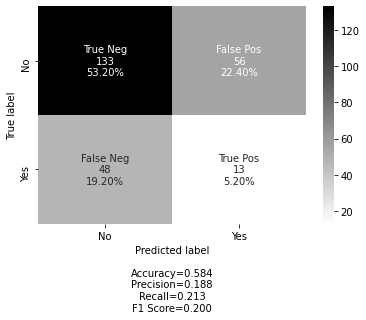

In [119]:
labels = ['True Neg','False Pos','False Neg','True Pos']
categories = ['No', 'Yes']
make_confusion_matrix(cnf_matrix_lr, group_names=labels,categories=categories,cmap='binary')

In [120]:


cv_scores_test= cross_val_score(Logreg,X_test_scaled,y_test,cv=5,scoring='roc_auc')
cv_scores_train= cross_val_score(Logreg,X_train_scaled,y_train,cv=5,scoring='roc_auc')
print(cv_scores_test)
cv_scores_lr_test= cv_scores_test.mean()
cv_scores_lr_train= cv_scores_train.mean()
cv_scores_std_test_lr= cv_scores_test.std()
print ('Mean cross validation test score: ' +str(cv_scores_lr_test))
print ('Mean cross validation train score: ' +str(cv_scores_lr_train))
print ('Standard deviation in cv test scores: ' +str(cv_scores_std_test_lr))

[0.56140351 0.64473684 0.39473684 0.57675439 0.47193347]
Mean cross validation test score: 0.5299130101761681
Mean cross validation train score: 0.5082266289677795
Standard deviation in cv test scores: 0.08718314244811652


**Precision Recall chart comparing baseline model and SMOTE model**

>Precision recall model for the baseline model

In [125]:
#Replace to numeric the prediction values
y_test_predict_lr_num=pd.DataFrame(y_test_pred_lr).replace(to_replace=['N','Y'],value=[0,1])
y_train_predict_lr_num=pd.DataFrame(y_train_pred_lr).replace(to_replace=['N','Y'],value=[0,1])

In [127]:
#Precision recall for baseline Logistic regression model

precision_test_lr, recall_test_lr, thresholds_test_lr = precision_recall_curve(y_test_num, y_test_predict_lr_num)
pr_auc_test_lr = auc(recall_test_lr, precision_test_lr)

precision_train_lr, recall_train_lr, thresholds_teain_lr = precision_recall_curve(y_train_num,y_train_predict_lr_num)
pr_auc_train_lr = auc(recall_train_lr, precision_train_lr)

>Precision recall model for the SMOTE model

In [216]:
#Replace to numeric in the prediction values

y_test_predict_lr_sm_num=pd.DataFrame(y_test_pred_lr_sm).replace(to_replace=['N','Y'],value=[0,1])
y_train_predict_lr_sm_num=pd.DataFrame(y_train_pred_lr_sm).replace(to_replace=['N','Y'],value=[0,1])

In [217]:
#Precision recall for SMOTE Logistic regression model

precision_test_lr_sm, recall_test_lr_sm, thresholds_test_lr_sm = precision_recall_curve(y_test_num, y_test_predict_lr_sm_num)
pr_auc_test_lr_sm = auc(recall_test_lr_sm, precision_test_lr_sm)

precision_train_lr_sm, recall_train_lr_sm, thresholds_teain_lr_sm = precision_recall_curve(y_train_sm_num,y_train_predict_lr_sm_num)
pr_auc_train_lr_sm= auc(recall_train_lr_sm, precision_train_lr_sm)

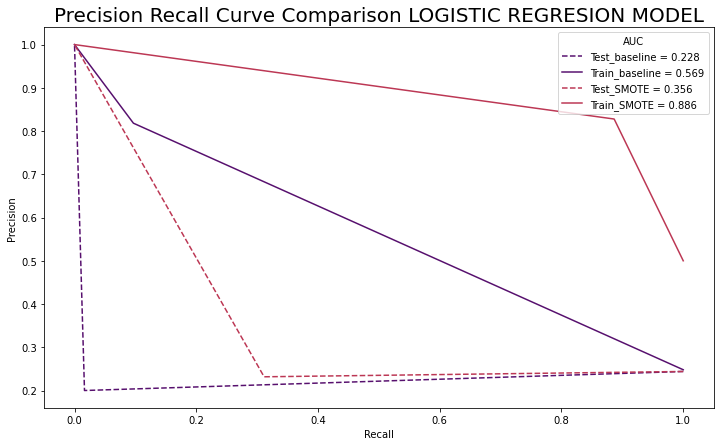

In [218]:
_ = plt.figure(figsize=(12,7))
_ = plt.title('Precision Recall Curve Comparison LOGISTIC REGRESION MODEL', size=20)
_ = plt.plot(recall_test_lr, precision_test_lr, label = 'Test_baseline = %0.3f' % pr_auc_test_lr,color=colors[1], linestyle='--')
_ = plt.plot(recall_train_lr,precision_train_lr, label = 'Train_baseline = %0.3f' % pr_auc_train_lr,color=colors[1])
_ = plt.plot(recall_test_lr_sm,precision_test_lr_sm, label = 'Test_SMOTE = %0.3f' % pr_auc_test_lr_sm,color=colors[2], linestyle='--')
_ = plt.plot(recall_train_lr_sm,precision_train_lr_sm, label = 'Train_SMOTE = %0.3f' % pr_auc_train_lr_sm,color=colors[2])


#_ = plt.plot(recallxg, precisionxg, label = 'XGBoost = %0.3f' % pr_aucxg)
_ = plt.ylabel('Precision')
_ = plt.xlabel('Recall')
_ = plt.legend(title='AUC')
_ = plt.show()

# <font color='teal'> Feedforward neural network

In [151]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import SGD, Adam




In [191]:
#from object_detection.utils.metrics import compute_precision_recall
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score
from sklearn.metrics import auc

I will first try the feedforward neural network model with the SMOTE over-sampling technique.

In [153]:
#Baseline model with SMOTE training dataset
model_sm = Sequential()
model_sm.add(Dense(4, input_dim=371, activation='tanh'))
model_sm.add(Dense(2, activation='tanh'))
model_sm.add(Dense(1, activation='sigmoid'))
model_sm.compile(Adam(lr=0.05),loss='binary_crossentropy', metrics=['accuracy',tf.keras.metrics.AUC()])



In [160]:
model_sm.fit(X_train_sm, y_train_sm_num, epochs=100, verbose=0)

In [161]:
sm_results = model_sm.evaluate(X_test_scaled, y_test,verbose=0)

In [167]:
y_train_predictions_sm = model_sm.predict(X_train_sm).astype("int32")
y_test_predictions_sm = model_sm.predict(X_test_scaled).astype("int32")

loss :  1.60710608959198
accuracy :  0.5960000157356262
auc_2 :  0.49145635962486267

Legitimate Transactions Detected (True Negatives):  189
Legitimate Transactions Incorrectly Detected (False Positives):  0
Fraudulent Transactions Missed (False Negatives):  61
Fraudulent Transactions Detected (True Positives):  0
Total Fraudulent Transactions:  61


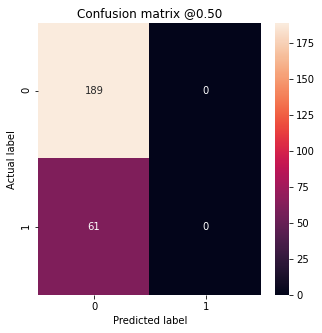

In [169]:
#Confusion matrix.
for name, value in zip(model_sm.metrics_names, sm_results):
  print(name, ': ', value)
print()

plot_cm(y_test, y_test_predictions_sm)

Now I will calculate the feedforward neural network model without SMOTE over-sampling.

In [170]:
model = Sequential()
model.add(Dense(4, input_dim=371, activation='tanh'))
model.add(Dense(2, activation='tanh'))
model.add(Dense(1, activation='sigmoid'))
model.compile(Adam(lr=0.05),loss='binary_crossentropy', metrics=['accuracy',tf.keras.metrics.AUC()])

model.fit(X_train_scaled, y_train, epochs=100, verbose=0)



In [171]:
results = model.evaluate(X_test_scaled, y_test)

8/8 [==============================] - 0s 2ms/step - loss: 0.9963 - accuracy: 0.6880 - auc_3: 0.4940


In [173]:
y_train_predictions = model.predict(X_train_scaled).astype("int32")
y_test_predictions = model.predict(X_test_scaled).astype("int32")

loss :  0.9962761402130127
accuracy :  0.6880000233650208
auc_3 :  0.49401506781578064

Legitimate Transactions Detected (True Negatives):  189
Legitimate Transactions Incorrectly Detected (False Positives):  0
Fraudulent Transactions Missed (False Negatives):  61
Fraudulent Transactions Detected (True Positives):  0
Total Fraudulent Transactions:  61


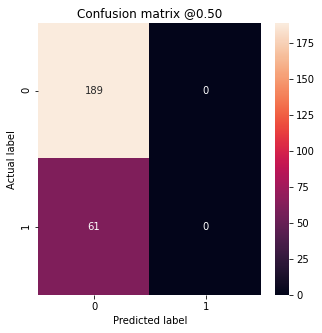

In [174]:
#Confusion matrix.
for name, value in zip(model.metrics_names, results):
  print(name, ': ', value)
print()

plot_cm(y_test, y_test_predictions)

Precision Recall for feedforward neural network model.

>Precision Recall for baseline feedforward neural networkmodel (Non-SMOTE over-sampling).





In [178]:
#Precision recall for Basline Model

precision_test_b, recall_test_b, thresholds_test_b = precision_recall_curve(y_test_num, y_test_predictions)
pr_auc_test_b = auc(recall_test_b, precision_test_b)

precision_train_b, recall_train_b, thresholds_teain_b = precision_recall_curve(y_train_num, y_train_predictions)
pr_auc_train_b = auc(recall_train_b, precision_train_b)

>Precision Recall for SMORE feedforward neural network model.

In [180]:
#Precision recall for SMOTE Model

precision_test_sm, recall_test_sm, thresholds_test_sm = precision_recall_curve(y_test_num, y_test_predictions_sm)
pr_auc_test_sm = auc(recall_test_sm, precision_test_sm)

precision_train_sm, recall_train_sm, thresholds_teain_sm = precision_recall_curve(y_train_sm_num, y_train_predictions_sm)
pr_auc_train_sm = auc(recall_train_sm, precision_train_sm)

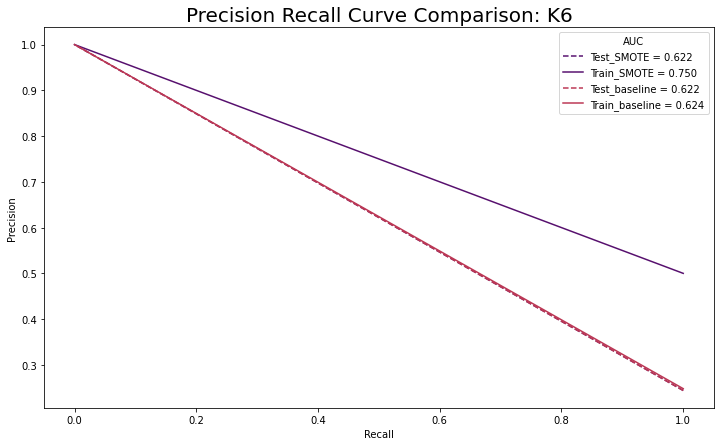

In [184]:
_ = plt.figure(figsize=(12,7))
_ = plt.title('Precision Recall Curve Comparison: K6', size=20)
_ = plt.plot(recall_test_sm, precision_test_sm, label = 'Test_SMOTE = %0.3f' % pr_auc_test_sm,color=colors[1], linestyle='--')
_ = plt.plot(recall_train_sm,precision_train_sm, label = 'Train_SMOTE = %0.3f' % pr_auc_train_sm,color=colors[1])
_ = plt.plot(recall_test_b, precision_test_b, label = 'Test_baseline = %0.3f' % pr_auc_test_b,color=colors[2], linestyle='--')
_ = plt.plot(recall_train_b,precision_train_b, label = 'Train_baseline = %0.3f' % pr_auc_train_b,color=colors[2])
#_ = plt.plot(recallxg, precisionxg, label = 'XGBoost = %0.3f' % pr_aucxg)
_ = plt.ylabel('Precision')
_ = plt.xlabel('Recall')
_ = plt.legend(title='AUC')
_ = plt.show()

**Model metrics evaluation**

In [196]:
from terminaltables import AsciiTable

The following summary table only takes in to consideration the SMOTE over-sampling models.

In [219]:
l = [
  ['Model', 'TRAIN AUC Recall-Precision curve','TEST AUC Recall-Precision curve'],
  ['Random Forest',pr_auc_train_rf_sm,pr_auc_test_rf_sm],
  ['Naive Bayes', pr_auc_train_nb_sm,pr_auc_test_nb_sm],
  ['Logistic Regresion', pr_auc_train_lr_sm,pr_auc_test_lr_sm],
  ['Deep Learning', pr_auc_train_sm,pr_auc_test_sm],
]
table = AsciiTable(l)

print(table.table)

+--------------------+----------------------------------+---------------------------------+
| Model              | TRAIN AUC Recall-Precision curve | TEST AUC Recall-Precision curve |
+--------------------+----------------------------------+---------------------------------+
| Random Forest      | 1.0                              | 0.4677267759562841              |
| Naive Bayes        | 0.7946708463949843               | 0.49807398066414454             |
| Logistic Regresion | 0.8855384904419707               | 0.35559136345461817             |
| Deep Learning      | 0.75                             | 0.622                           |
+--------------------+----------------------------------+---------------------------------+


As we can see in the table the Random Forest, Naive Bayes, and Logistic Regression models overfit and have low testing AUC Recall-Precision values. In this case I will select the Deep learning model since we do not see overfiting and has a 0.622 AUC Recall-Precision value, higher than the other models considered.


# <a name="Summary_section"></a>**Future Improvements**







Given the results obtained when comparing the different models studied, it seems that the model to select is the feedforward neural network. It does not overfit as much as the other models and has a AUC Recll-Precision of 0.622.
Some improvements to the analysis will be to perform a hyperparameter on the feedforward neural network to see if we can achieve more accurate predictions. 

I would also like to work on an application of a backpropagation neural network (BPNN) which I found in the literature to be used on fraud detection problems.


# Credits.

I would like to thank my two mentors at Springboard, Eduardo Carrasco and David Lara Arango.